### Exploratory data analysis / data cleaning on the training dataset

#### Importing the libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

#### Loading the dataset

In [2]:
dataset_train=pd.read_csv('../data/raw/train.csv')
dataset_train.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [3]:
len(dataset_train['Store'].unique())

45

In [4]:
len(dataset_train['Dept'].unique())

81

In [5]:
dataset_train.isna().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

In [6]:
dataset_train['Date']=pd.to_datetime(dataset_train['Date'])

In [7]:
print(dataset_train.describe())
dataset_train.shape

               Store           Dept                           Date  \
count  421570.000000  421570.000000                         421570   
mean       22.200546      44.260317  2011-06-18 08:30:31.963375104   
min         1.000000       1.000000            2010-02-05 00:00:00   
25%        11.000000      18.000000            2010-10-08 00:00:00   
50%        22.000000      37.000000            2011-06-17 00:00:00   
75%        33.000000      74.000000            2012-02-24 00:00:00   
max        45.000000      99.000000            2012-10-26 00:00:00   
std        12.785297      30.492054                            NaN   

        Weekly_Sales  
count  421570.000000  
mean    15981.258123  
min     -4988.940000  
25%      2079.650000  
50%      7612.030000  
75%     20205.852500  
max    693099.360000  
std     22711.183519  


(421570, 5)

#### Time ranges for different Store,Department pairs

In [8]:
dataset_train=dataset_train.sort_values(by=['Store','Dept','Date']).reset_index(drop=True)

time_range_df=dataset_train.groupby(by=['Store','Dept'])['Date'].agg(lambda x: (x.min(),x.max()))
pd.set_option('display.max_rows',None)
print(time_range_df)

Store  Dept
1      1       (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       2       (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       3       (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       4       (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       5       (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       6       (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       7       (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       8       (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       9       (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       10      (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       11      (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       12      (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       13      (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       14      (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       16      (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       17      (2010-02-05 00:00:00, 2012-10-26 00:00:00)
       18      (2010-02-05 00:00:00, 2012-10-26 00:00:00)
  

#### Date values where IsHoliday Feature column is true. Meaning that the week is considered Holiday Week

In [9]:
dataset_train['Date']=pd.to_datetime(dataset_train['Date'])
dataset_train[dataset_train['IsHoliday']==True]['Date'].unique()

<DatetimeArray>
['2010-02-12 00:00:00', '2010-09-10 00:00:00', '2010-11-26 00:00:00',
 '2010-12-31 00:00:00', '2011-02-11 00:00:00', '2011-09-09 00:00:00',
 '2011-11-25 00:00:00', '2011-12-30 00:00:00', '2012-02-10 00:00:00',
 '2012-09-07 00:00:00']
Length: 10, dtype: datetime64[ns]

#### Analysis of dataset_features starts

In [10]:
dataset_features=pd.read_csv('../data/raw/features.csv')
dataset_features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [11]:
dataset_features.dtypes

Store             int64
Date             object
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
IsHoliday          bool
dtype: object

In [12]:
dataset_features.isna().sum()

Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
dtype: int64

In [13]:
print(dataset_features.describe())
dataset_features.shape

             Store  Temperature   Fuel_Price      MarkDown1      MarkDown2  \
count  8190.000000  8190.000000  8190.000000    4032.000000    2921.000000   
mean     23.000000    59.356198     3.405992    7032.371786    3384.176594   
std      12.987966    18.678607     0.431337    9262.747448    8793.583016   
min       1.000000    -7.290000     2.472000   -2781.450000    -265.760000   
25%      12.000000    45.902500     3.041000    1577.532500      68.880000   
50%      23.000000    60.710000     3.513000    4743.580000     364.570000   
75%      34.000000    73.880000     3.743000    8923.310000    2153.350000   
max      45.000000   101.950000     4.468000  103184.980000  104519.540000   

           MarkDown3     MarkDown4      MarkDown5          CPI  Unemployment  
count    3613.000000   3464.000000    4050.000000  7605.000000   7605.000000  
mean     1760.100180   3292.935886    4132.216422   172.460809      7.826821  
std     11276.462208   6792.329861   13086.690278    39.7383

(8190, 12)

In [14]:
print(dataset_features['Store'].unique())
len(dataset_features['Store'].unique())

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45]


45

In [15]:
dataset_features['Date']=pd.to_datetime(dataset_features['Date'])

#### Calculating the time ranges for each of the stores

In [16]:
dataset_features=dataset_features.sort_values(by=['Store','Date']).reset_index(drop=True)
feature_time_range_df=dataset_features.groupby(by=['Store'])['Date'].agg(lambda x: (x.min(),x.max()))
feature_time_range_df

Store
1     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
2     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
3     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
4     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
5     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
6     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
7     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
8     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
9     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
10    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
11    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
12    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
13    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
14    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
15    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
16    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
17    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
18    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
19    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
20    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
21    (2010-02

#### Checking if the values of the date feature column is using a weekly pattern or not

In [17]:
dataset_features['date_diff'] = dataset_features.groupby('Store')['Date'].diff()
weekly_gaps = dataset_features[dataset_features['date_diff'] != pd.Timedelta(days=7)]

# weekly_gaps will show all rows where the weekly gap is broken
print(weekly_gaps)

      Store       Date  Temperature  Fuel_Price  MarkDown1  MarkDown2  \
0         1 2010-02-05        42.31       2.572        NaN        NaN   
182       2 2010-02-05        40.19       2.572        NaN        NaN   
364       3 2010-02-05        45.71       2.572        NaN        NaN   
546       4 2010-02-05        43.76       2.598        NaN        NaN   
728       5 2010-02-05        39.70       2.572        NaN        NaN   
910       6 2010-02-05        40.43       2.572        NaN        NaN   
1092      7 2010-02-05        10.53       2.580        NaN        NaN   
1274      8 2010-02-05        34.14       2.572        NaN        NaN   
1456      9 2010-02-05        38.01       2.572        NaN        NaN   
1638     10 2010-02-05        54.34       2.962        NaN        NaN   
1820     11 2010-02-05        46.04       2.572        NaN        NaN   
2002     12 2010-02-05        49.47       2.962        NaN        NaN   
2184     13 2010-02-05        31.53       2.666    

#### This output means that the date column is clean in terms of not having any weekly breaks in the time ranges for any of the store

In [18]:
dataset_features.drop(columns=['date_diff'],inplace=True)

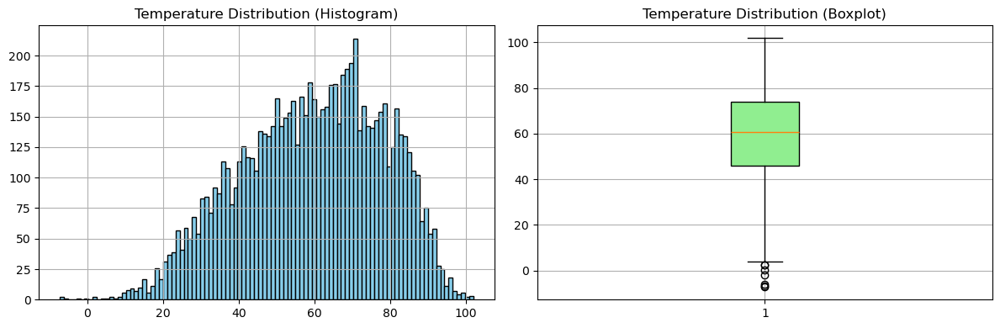

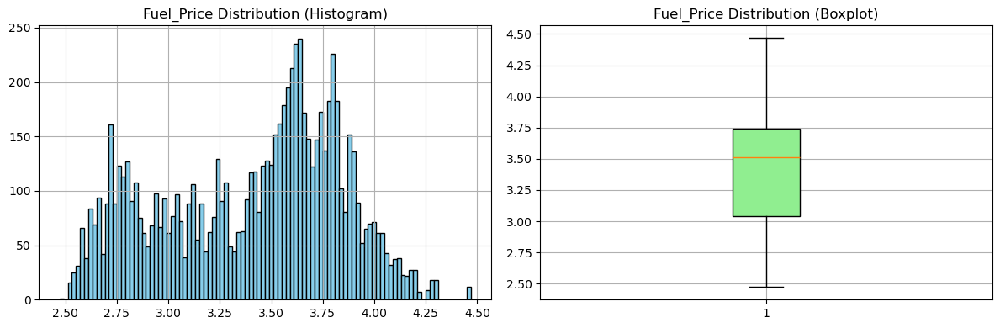

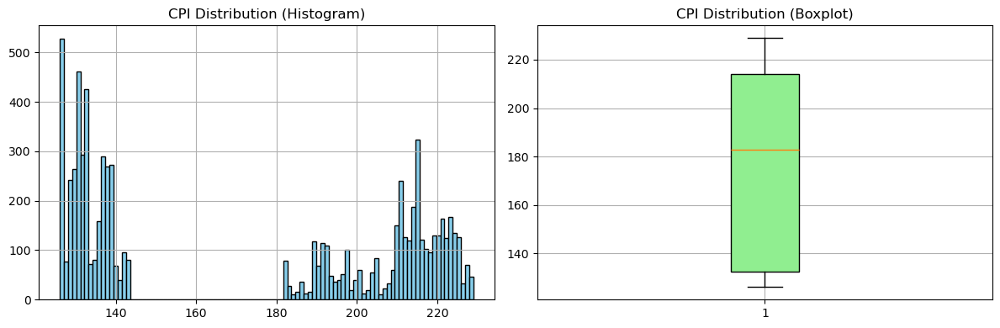

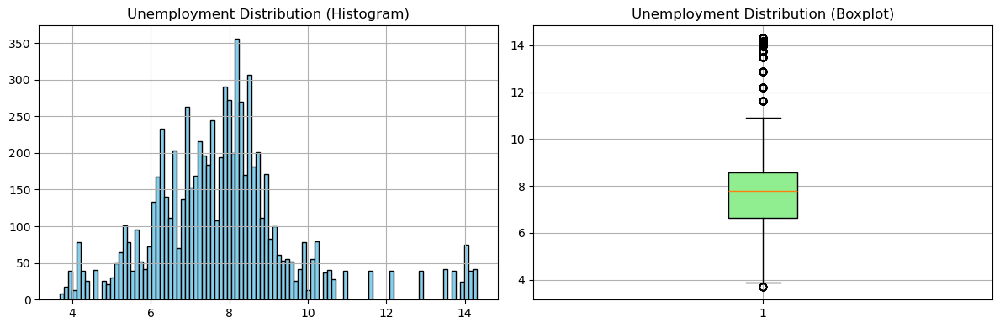

In [19]:
import matplotlib.pyplot as plt

columns = ['Temperature','Fuel_Price','CPI','Unemployment']

for col in columns:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))  # 1 row, 2 columns
    
    # Histogram
    axes[0].hist(dataset_features[col].dropna(), bins=100, color='skyblue', edgecolor='black')
    axes[0].set_title(f"{col} Distribution (Histogram)")
    axes[0].grid(True)
    
    # Boxplot
    axes[1].boxplot(dataset_features[col].dropna(), vert=True, patch_artist=True,
                    boxprops=dict(facecolor='lightgreen'))
    axes[1].set_title(f"{col} Distribution (Boxplot)")
    axes[1].grid(True)
    
    plt.tight_layout()
    plt.show()


In [20]:
dataset_features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [21]:
dataset_features.isna().sum()

Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
dtype: int64

##### Lets visualize the Temperature cycles for each store

In [22]:
temperature_df=dataset_features.copy()[['Store','Date','Temperature','IsHoliday']]
temperature_df.head()

,Store,Date,Temperature,IsHoliday
0,1,2010-02-05,42.31,False
1,1,2010-02-12,38.51,True
2,1,2010-02-19,39.93,False
3,1,2010-02-26,46.63,False
4,1,2010-03-05,46.50,False


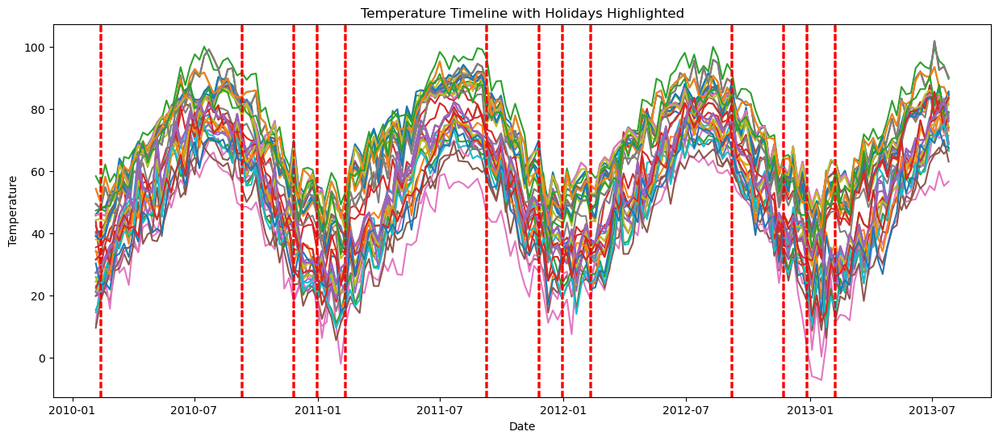

In [23]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure Date column is datetime and data is sorted
temperature_df['Date'] = pd.to_datetime(temperature_df['Date'])
temperature_df = temperature_df.sort_values(by=['Store', 'Date']).reset_index(drop=True)

stores = temperature_df['Store'].unique()

plt.figure(figsize=(15, 6))

for store_id in stores:
    store_data = temperature_df[temperature_df['Store'] == store_id]
    
    # Plot temperature line
    plt.plot(store_data['Date'], store_data['Temperature'], label=f'Store {store_id}')
    
    # Add vertical dashed lines for holidays
    holiday_dates = store_data.loc[store_data['IsHoliday'] == True, 'Date']
    for date in holiday_dates:
        plt.axvline(x=date, color='red', linestyle='--', alpha=0.5)

plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Timeline with Holidays Highlighted')
plt.show()


#### Observation(Obvious): Temperature has cyclic trends for all the stores

#### Now lets visualize the fuel prices for each store in respect to date as a timeline

In [24]:
fuel_df=dataset_features.copy()[['Store','Date','Fuel_Price','IsHoliday']]
fuel_df.head()

,Store,Date,Fuel_Price,IsHoliday
0,1,2010-02-05,2.572,False
1,1,2010-02-12,2.548,True
2,1,2010-02-19,2.514,False
3,1,2010-02-26,2.561,False
4,1,2010-03-05,2.625,False


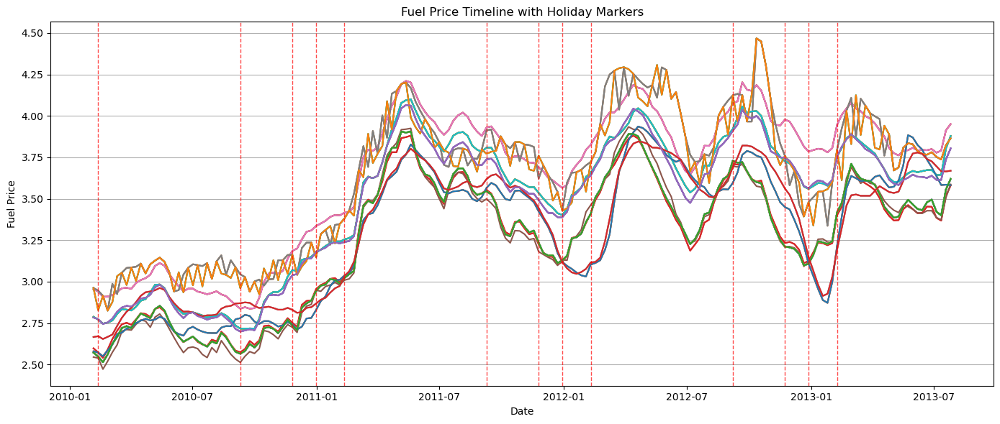

In [25]:
import matplotlib.pyplot as plt

fuel_df = fuel_df.sort_values(by=['Store','Date']).reset_index(drop=True)

plt.figure(figsize=(14,6))

# Plot fuel prices for each store
for store_id in fuel_df['Store'].unique():
    store_data = fuel_df[fuel_df['Store'] == store_id]
    plt.plot(store_data['Date'], store_data['Fuel_Price'], label=f'Store {store_id}')

# Extract unique holiday dates
holiday_dates = fuel_df.loc[fuel_df['IsHoliday'] == True, 'Date'].unique()

# Add vertical dashed lines for holidays
for holiday in holiday_dates:
    plt.axvline(x=holiday, color='red', linestyle='--', alpha=0.7, linewidth=1)

plt.title("Fuel Price Timeline with Holiday Markers")
plt.ylabel("Fuel Price")
plt.xlabel("Date")
plt.grid(axis='y')
plt.tight_layout()
plt.show()


#### Observation: Fuel Prices spike after the holidays each year before a decline in the fuel price after which the spike of the fuel prices is experienced after the last holiday date of the year

#### Now lets perform the hypothesis testing over this observation to quantify the % increase of the fuel prices in the time period

#### Null Hypothesis (H_0): There is no significant difference between fuel prices pre and post holiday weeks
#### Alternative Hypothesis (H_1): Fuel prices spike significantly post holiday weeks

In [26]:
import pandas as pd

holiday_weeks = dataset_features[dataset_features['IsHoliday'] == True][['Store', 'Date', 'Fuel_Price']]

# For each holiday week, get next week's fuel price
pairs = []
for store in dataset_features['Store'].unique():
    store_df = dataset_features[dataset_features['Store'] == store]
    for _, row in holiday_weeks[holiday_weeks['Store'] == store].iterrows():
        holiday_date = row['Date']
        next_week = holiday_date + pd.Timedelta(weeks=1)
        next_row = store_df[store_df['Date'] == next_week]
        if not next_row.empty:
            pairs.append({
                'Store': store,
                'Holiday_Fuel': row['Fuel_Price'],
                'PostHoliday_Fuel': float(next_row['Fuel_Price'])
            })

pairs_df = pd.DataFrame(pairs)
pairs_df['Diff'] = pairs_df['PostHoliday_Fuel'] - pairs_df['Holiday_Fuel']
pairs_df.head()


C:\Windows\Temp\ipykernel_14740\228855077.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  'PostHoliday_Fuel': float(next_row['Fuel_Price'])
C:\Windows\Temp\ipykernel_14740\228855077.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  'PostHoliday_Fuel': float(next_row['Fuel_Price'])
C:\Windows\Temp\ipykernel_14740\228855077.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  'PostHoliday_Fuel': float(next_row['Fuel_Price'])
C:\Windows\Temp\ipykernel_14740\228855077.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  'PostHoliday_Fuel': float(next_row['Fuel_Price'])
C:\Windows\Temp\ipykerne

,Store,Holiday_Fuel,PostHoliday_Fuel,Diff
0,1,2.548,2.514,-0.034
1,1,2.565,2.582,0.017
2,1,2.735,2.708,-0.027
3,1,2.943,2.976,0.033
4,1,3.022,3.045,0.023


**Test Selection:**  
We used the **Wilcoxon Signed-Rank Test** because:

1. The data consists of **paired observations** (holiday vs. post-holiday weeks).  
2. The differences in fuel prices were **not normally distributed** (Shapiro-Wilk p-value < 0.05).  
3. Wilcoxon is **robust to deviations from normality** and evaluates median differences, making it ideal for this scenario.

In [27]:
from scipy.stats import wilcoxon

# differences
diffs = pairs_df['PostHoliday_Fuel'] - pairs_df['Holiday_Fuel']

# Wilcoxon test
stat, p = wilcoxon(diffs, alternative='greater')  # 'greater' since H1 is post > holiday
print("Wilcoxon test statistic:", stat)
print("p-value:", p)


Wilcoxon test statistic: 104691.5
p-value: 1.3051210000100783e-07


**Interpretation:**  
Since the p-value is < 0.05, we **reject the null hypothesis**. Fuel prices **significantly increase after holiday weeks**, which can inform pricing and inventory strategies.

In [28]:
from scipy.stats import ttest_rel

# Paired t-test: Holiday vs Post-Holiday fuel prices
t_stat, p_val = ttest_rel(pairs_df['PostHoliday_Fuel'], pairs_df['Holiday_Fuel'])

print("Paired t-test statistic:", t_stat)
print("Paired t-test p-value:", p_val)


Paired t-test statistic: 4.439181672540198
Paired t-test p-value: 1.0799008671616342e-05


### Comparison with Paired t-Test

For reference, we also performed a **paired t-test**:

- **t-statistic:** 4.44  
- **p-value:** 1.08 × 10⁻⁵  

**Interpretation:**  
- The paired t-test also indicates a statistically significant increase in post-holiday fuel prices.  
- **However**, the normality assumption for the differences was strongly violated (Shapiro-Wilk p ≈ 3.84 × 10⁻¹³), making the t-test **less reliable**.  

**Conclusion:**  
- The **Wilcoxon signed-rank test** remains the preferred method, as it does not assume normality and robustly tests median differences.

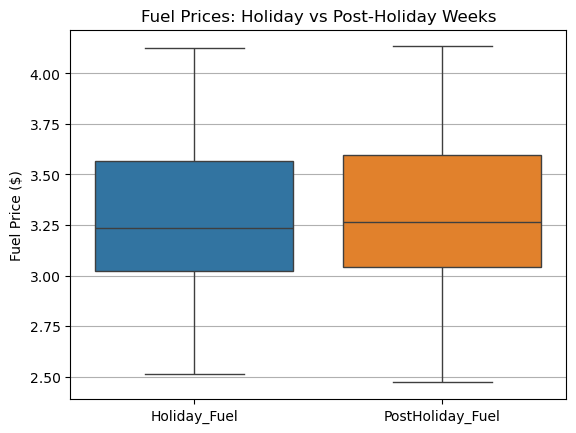

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.boxplot(data=pairs_df[['Holiday_Fuel', 'PostHoliday_Fuel']])
plt.title("Fuel Prices: Holiday vs Post-Holiday Weeks")
plt.ylabel("Fuel Price ($)")
plt.grid(axis='y')
plt.show()


#### Business Insight from Fuel Price Analysis

- Observation: Fuel prices spike after holiday weeks across all stores.
- Impact: Higher fuel prices increase customers’ commuting costs, which may lead to a **decrease in weekly sales**.
- Recommended Action: Implement **targeted markdowns or discounts** on select products during post-holiday weeks to maintain customer traffic and mitigate the impact of higher fuel prices on sales.


In [30]:
dataset_features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


### Hypothesis: Effect of Post-Holiday Fuel Price Increase on Weekly Sales

**Objective:** Test whether a spike in fuel prices after holiday weeks affects weekly sales at Walmart stores.

**Null Hypothesis (H0):**  
Post-holiday fuel price increase **does not affect weekly sales**.  
\[
H_0: \text{Median difference in weekly sales before and after fuel price increase} = 0
\]

**Alternative Hypothesis (H1):**  
Post-holiday fuel price increase **causes weekly sales to decrease**.  
\[
H_1: \text{Median difference in weekly sales before and after fuel price increase} < 0
\]

**Test Used:** Wilcoxon Signed-Rank Test (non-parametric, paired observations)


In [31]:
# Aggregate weekly sales across departments per store and date
weekly_sales_agg = dataset_train.groupby(['Store', 'Date'])['Weekly_Sales'].mean().reset_index()
weekly_sales_agg.rename(columns={'Weekly_Sales': 'Avg_Weekly_Sales'}, inplace=True)

In [32]:
# Ensure Date is in datetime format in both datasets
dataset_features['Date'] = pd.to_datetime(dataset_features['Date'])
weekly_sales_agg['Date'] = pd.to_datetime(weekly_sales_agg['Date'])

# Merge on Store and Date
features_train_avg_merged = pd.merge(dataset_features, weekly_sales_agg, on=['Store','Date'], how='left')

In [33]:
features_train_avg_merged.head()
features_train_avg_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Store             8190 non-null   int64         
 1   Date              8190 non-null   datetime64[ns]
 2   Temperature       8190 non-null   float64       
 3   Fuel_Price        8190 non-null   float64       
 4   MarkDown1         4032 non-null   float64       
 5   MarkDown2         2921 non-null   float64       
 6   MarkDown3         3613 non-null   float64       
 7   MarkDown4         3464 non-null   float64       
 8   MarkDown5         4050 non-null   float64       
 9   CPI               7605 non-null   float64       
 10  Unemployment      7605 non-null   float64       
 11  IsHoliday         8190 non-null   bool          
 12  Avg_Weekly_Sales  6435 non-null   float64       
dtypes: bool(1), datetime64[ns](1), float64(10), int64(1)
memory usage: 775.9 KB


In [34]:
features_train_avg_merged.isna().sum()

Store                  0
Date                   0
Temperature            0
Fuel_Price             0
MarkDown1           4158
MarkDown2           5269
MarkDown3           4577
MarkDown4           4726
MarkDown5           4140
CPI                  585
Unemployment         585
IsHoliday              0
Avg_Weekly_Sales    1755
dtype: int64

In [35]:
# Check which rows have missing Avg_Weekly_Sales
missing_rows = features_train_avg_merged[features_train_avg_merged['Avg_Weekly_Sales'].isnull()]
print(missing_rows[['Store','Date','IsHoliday']])


      Store       Date  IsHoliday
143       1 2012-11-02      False
144       1 2012-11-09      False
145       1 2012-11-16      False
146       1 2012-11-23       True
147       1 2012-11-30      False
148       1 2012-12-07      False
149       1 2012-12-14      False
150       1 2012-12-21      False
151       1 2012-12-28       True
152       1 2013-01-04      False
153       1 2013-01-11      False
154       1 2013-01-18      False
155       1 2013-01-25      False
156       1 2013-02-01      False
157       1 2013-02-08       True
158       1 2013-02-15      False
159       1 2013-02-22      False
160       1 2013-03-01      False
161       1 2013-03-08      False
162       1 2013-03-15      False
163       1 2013-03-22      False
164       1 2013-03-29      False
165       1 2013-04-05      False
166       1 2013-04-12      False
167       1 2013-04-19      False
168       1 2013-04-26      False
169       1 2013-05-03      False
170       1 2013-05-10      False
171       1 20

In [36]:
features_train_avg_merged['Avg_Weekly_Sales'] = features_train_avg_merged.groupby('Store')['Avg_Weekly_Sales'].transform(
    lambda x: x.fillna(x.mean())
)
features_train_avg_merged.isna().sum()

Store                  0
Date                   0
Temperature            0
Fuel_Price             0
MarkDown1           4158
MarkDown2           5269
MarkDown3           4577
MarkDown4           4726
MarkDown5           4140
CPI                  585
Unemployment         585
IsHoliday              0
Avg_Weekly_Sales       0
dtype: int64

In [37]:
# Create a flag column if fuel price increased post holiday
features_train_avg_merged['Fuel_Increase_PostHoliday'] = features_train_avg_merged.groupby('Store')['Fuel_Price'].diff().shift(-1) > 0

In [38]:
sales_increased_fuel = features_train_avg_merged[features_train_avg_merged['Fuel_Increase_PostHoliday'] == True]['Avg_Weekly_Sales']
sales_no_increase_fuel = features_train_avg_merged[features_train_avg_merged['Fuel_Increase_PostHoliday'] == False]['Avg_Weekly_Sales']

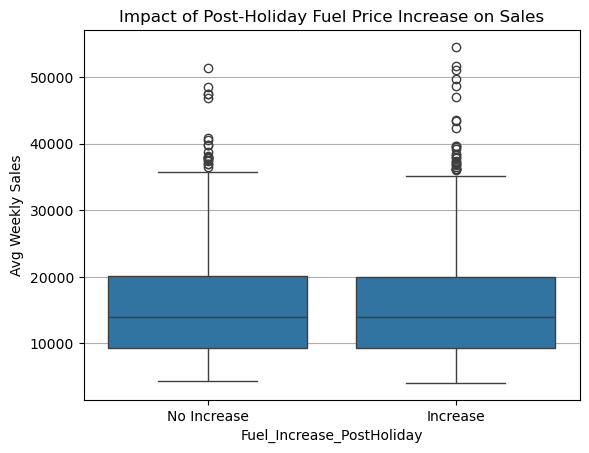

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x=features_train_avg_merged['Fuel_Increase_PostHoliday'], y=features_train_avg_merged['Avg_Weekly_Sales'])
plt.xticks([0,1], ['No Increase','Increase'])
plt.ylabel("Avg Weekly Sales")
plt.title("Impact of Post-Holiday Fuel Price Increase on Sales")
plt.grid(axis='y')
plt.show()


In [40]:
paired_sales = features_train_avg_merged.dropna(subset=['Avg_Weekly_Sales', 'Fuel_Price'])
paired_sales = paired_sales.sort_values(['Store','Date'])
paired_sales['Prev_Week_Sales'] = paired_sales.groupby('Store')['Avg_Weekly_Sales'].shift(1)
df_test = paired_sales[paired_sales['Fuel_Increase_PostHoliday']==True].dropna(subset=['Prev_Week_Sales'])
sales_diff = df_test['Avg_Weekly_Sales'] - df_test['Prev_Week_Sales']

In [41]:
from scipy.stats import wilcoxon

stat, p = wilcoxon(sales_diff)
print(f"Wilcoxon test statistic: {stat}, p-value: {p}")

Wilcoxon test statistic: 2888341.0, p-value: 0.5650803520695638


### Hypothesis Testing Conclusion

**Test Used:** Wilcoxon Signed-Rank Test (paired, non-parametric)  
**Test Statistic:** 2,888,341.0  
**p-value:** 0.565  

**Interpretation:**  
Since the p-value (0.565) is **greater than the significance level of 0.05**, we **fail to reject the null hypothesis**.  

**Conclusion:**  
There is **no statistically significant evidence** that a post-holiday increase in fuel prices affects the average weekly sales at Walmart stores at the aggregate store-week level.  

**Implications:**  
- The assumption that higher fuel prices reduce weekly sales is **not supported by this data**.  
- Other factors (holidays, promotions, markdowns, department-specific trends) may have a stronger influence on weekly sales.  
- Further analysis could include **department-level segmentation, lag effects, or correlat**


Correlation matrix:
                   Avg_Weekly_Sales  Fuel_Price
Avg_Weekly_Sales           1.00000     0.00791
Fuel_Price                 0.00791     1.00000


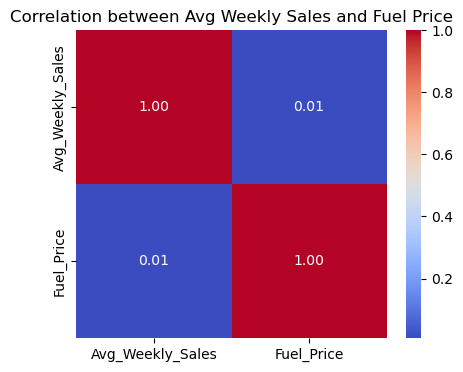

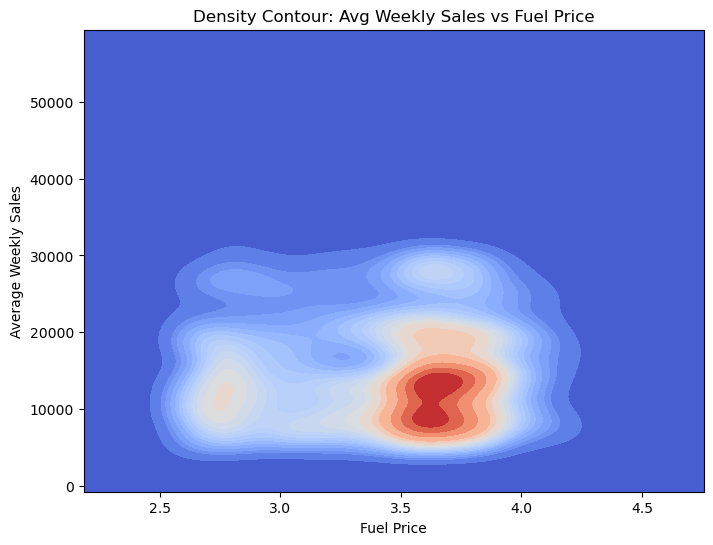

In [42]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Merge features and train dataset
merged_df = features_train_avg_merged.dropna(subset=['Avg_Weekly_Sales', 'Fuel_Price'])

# Compute correlation
corr_matrix = merged_df[['Avg_Weekly_Sales', 'Fuel_Price']].corr()
print("Correlation matrix:\n", corr_matrix)

# Plot correlation heatmap
plt.figure(figsize=(5,4))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation between Avg Weekly Sales and Fuel Price")
plt.show()

plot_df = merged_df.dropna(subset=['Avg_Weekly_Sales', 'Fuel_Price'])

plt.figure(figsize=(8,6))
sns.kdeplot(
    x=plot_df['Fuel_Price'], 
    y=plot_df['Avg_Weekly_Sales'], 
    fill=True,           # color the density
    cmap="coolwarm",     # color map
    thresh=0,            # show all contours
    levels=20            # number of contour levels
)
plt.title("Density Contour: Avg Weekly Sales vs Fuel Price")
plt.xlabel("Fuel Price")
plt.ylabel("Average Weekly Sales")
plt.show()



#### Visualizing the Markdown columns 1 to 5

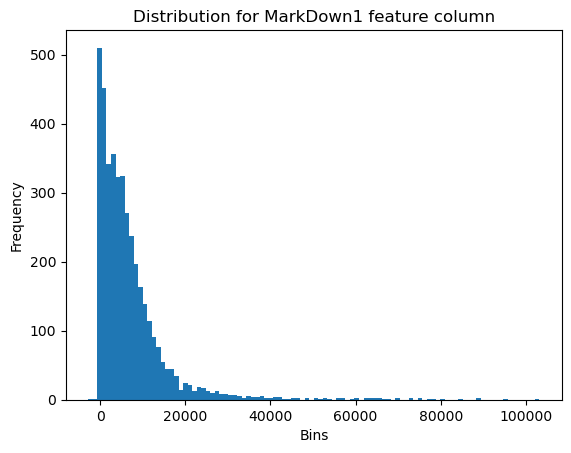

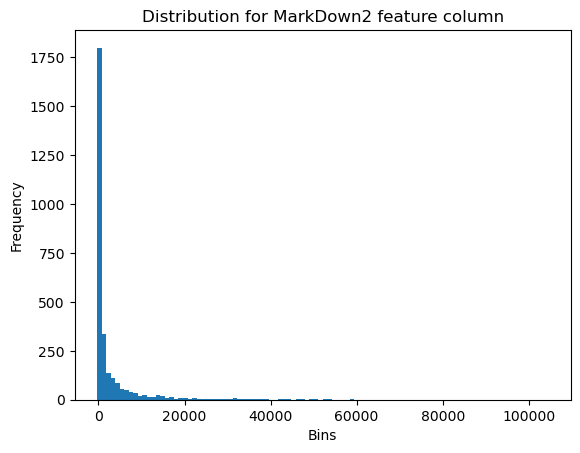

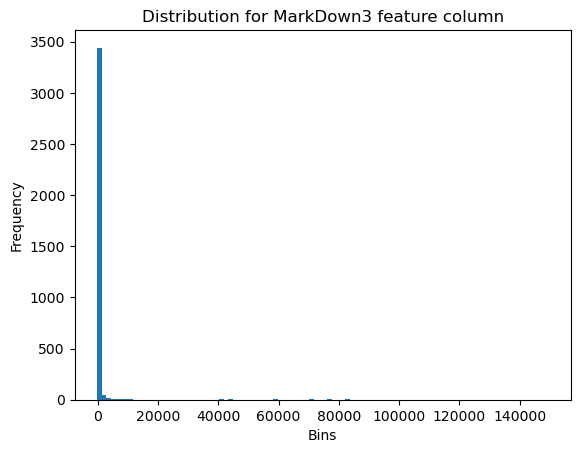

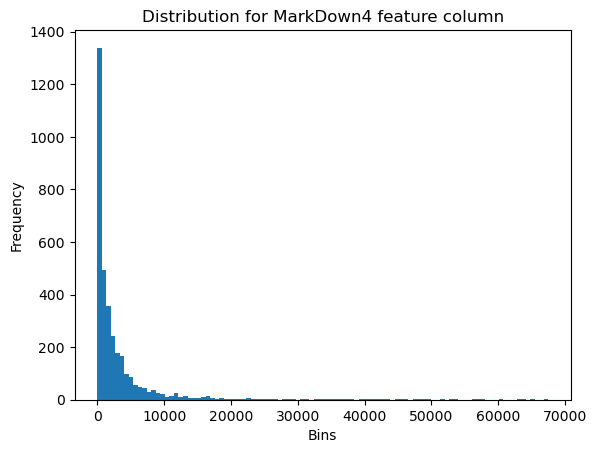

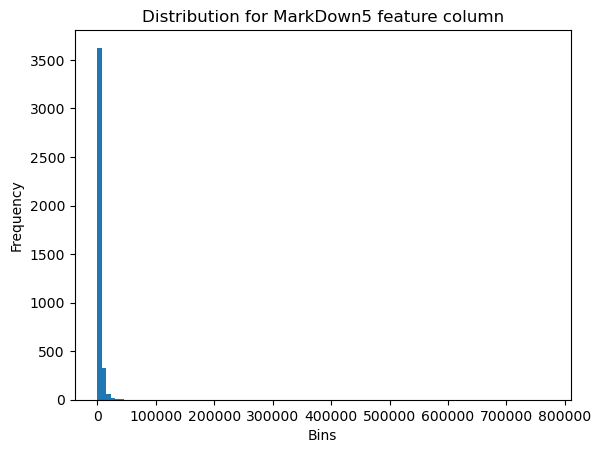

In [43]:
markdown_columns=['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5']

for col in markdown_columns:
    plt.hist(dataset_features[col],bins=100)
    plt.title(f"Distribution for {col} feature column")
    plt.xlabel("Bins")
    plt.ylabel("Frequency")
    plt.show()

In [44]:
dataset_features['Total_MarkDown']=dataset_features['MarkDown1']+dataset_features['MarkDown2']+dataset_features['MarkDown3']+dataset_features['MarkDown4']+dataset_features['MarkDown5']
dataset_features['Total_MarkDown'].fillna(0,inplace=True)

C:\Windows\Temp\ipykernel_14740\3672992238.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  dataset_features['Total_MarkDown'].fillna(0,inplace=True)


In [45]:
dataset_features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Total_MarkDown
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,0.0
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,0.0
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,0.0
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,0.0
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,0.0


#### Visualizing each markdown feature column with respect to a timeline

Store                  0
Date                   0
Temperature            0
Fuel_Price             0
MarkDown1           4158
MarkDown2           5269
MarkDown3           4577
MarkDown4           4726
MarkDown5           4140
CPI                  585
Unemployment         585
IsHoliday              0
Total_MarkDown         0
Max_Weekly_Sales    1755
dtype: int64


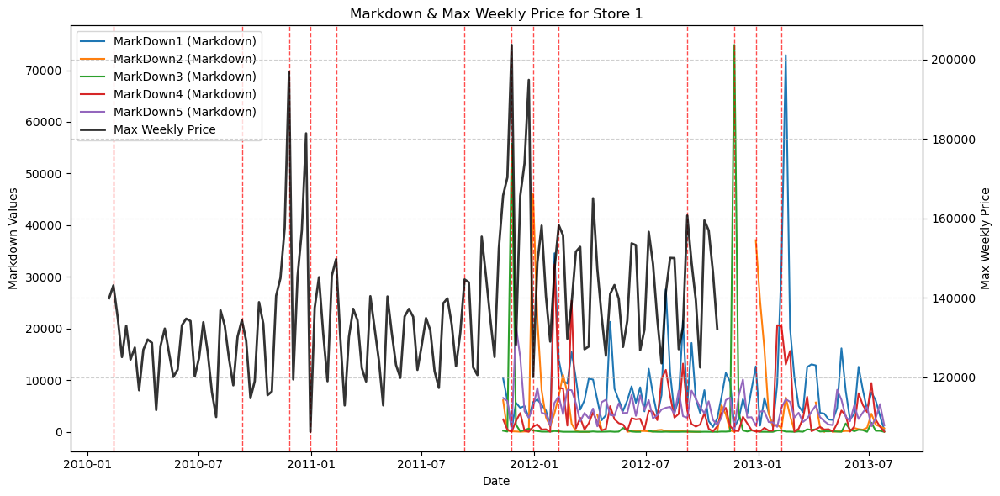

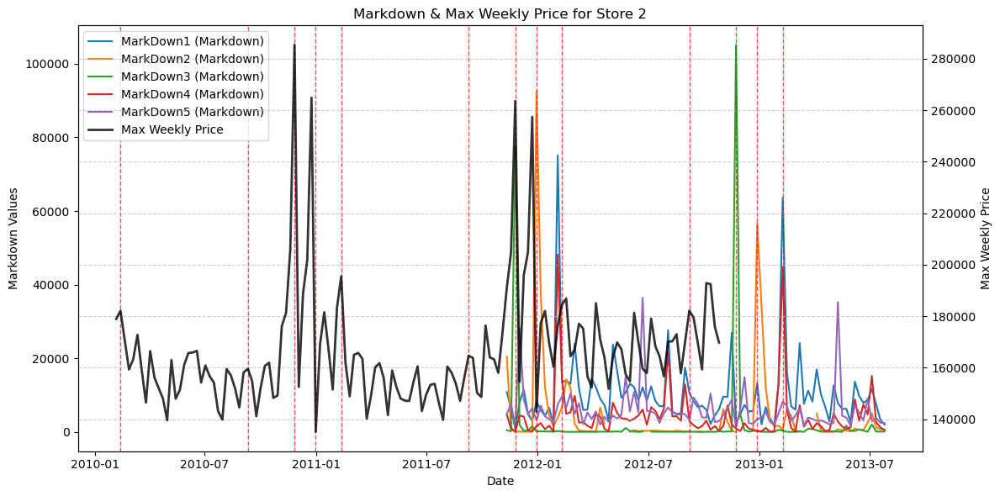

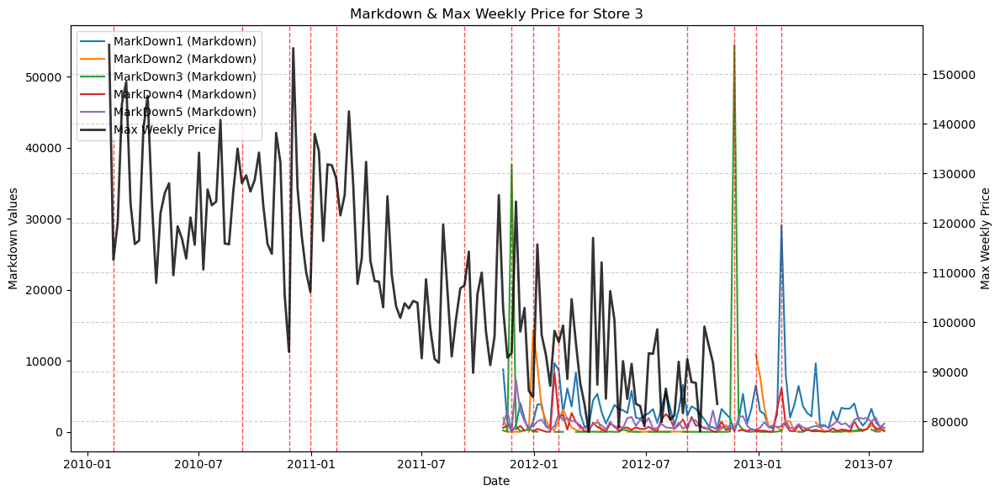

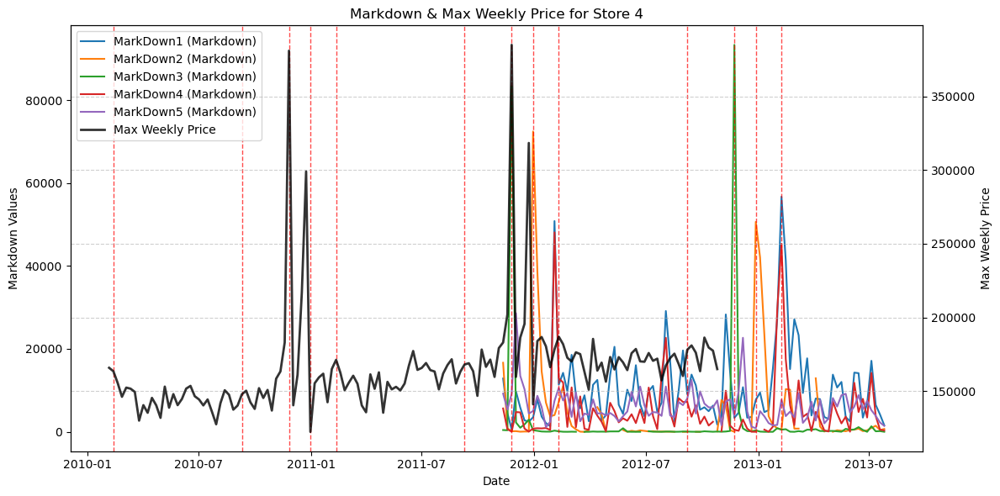

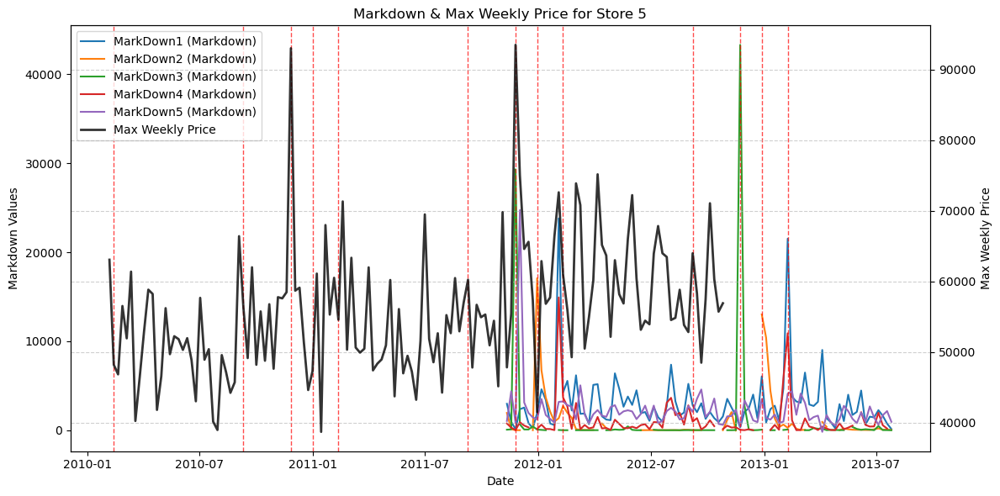

...

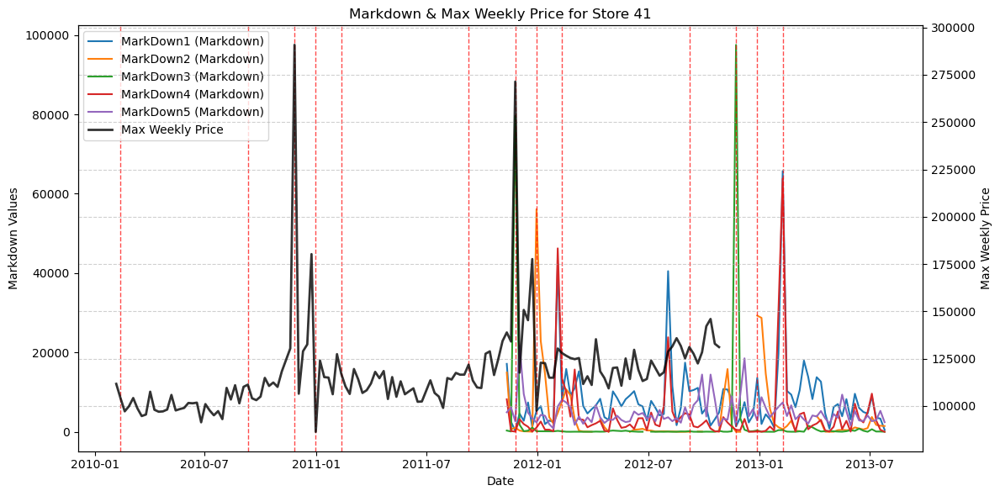

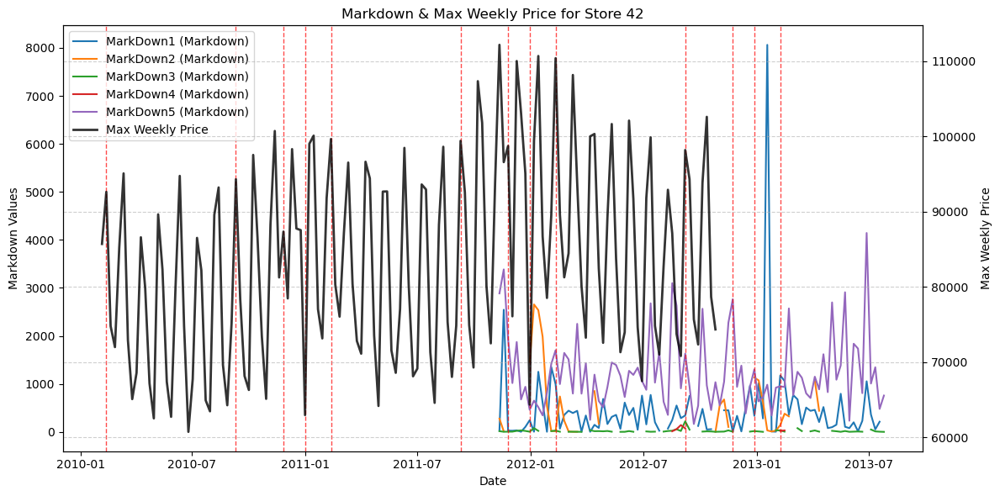

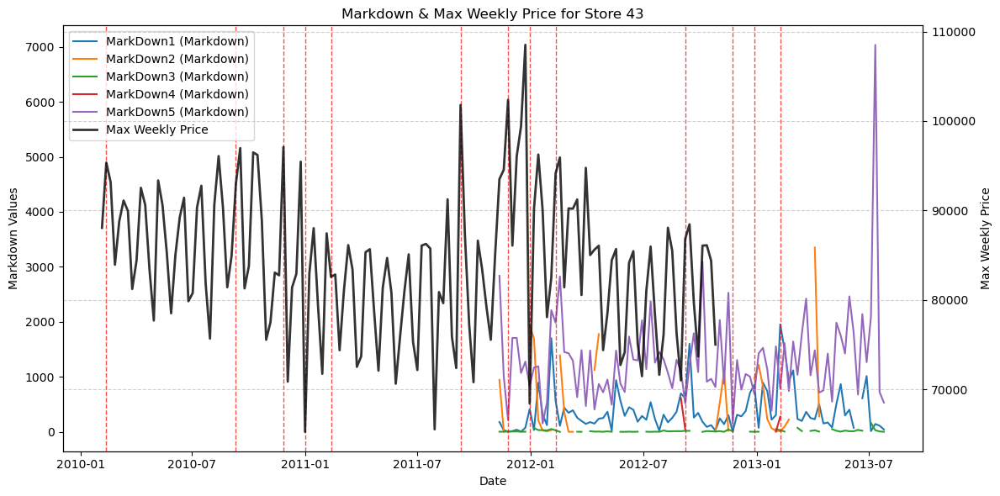

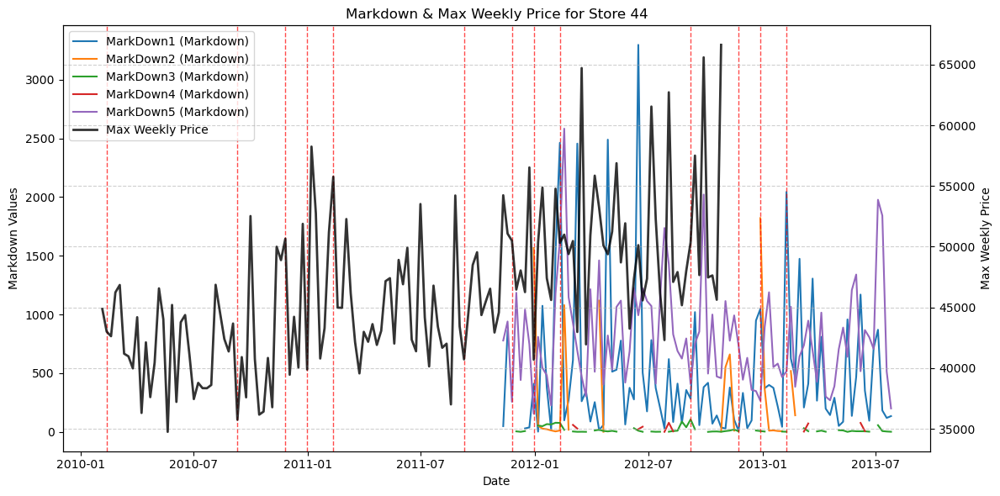

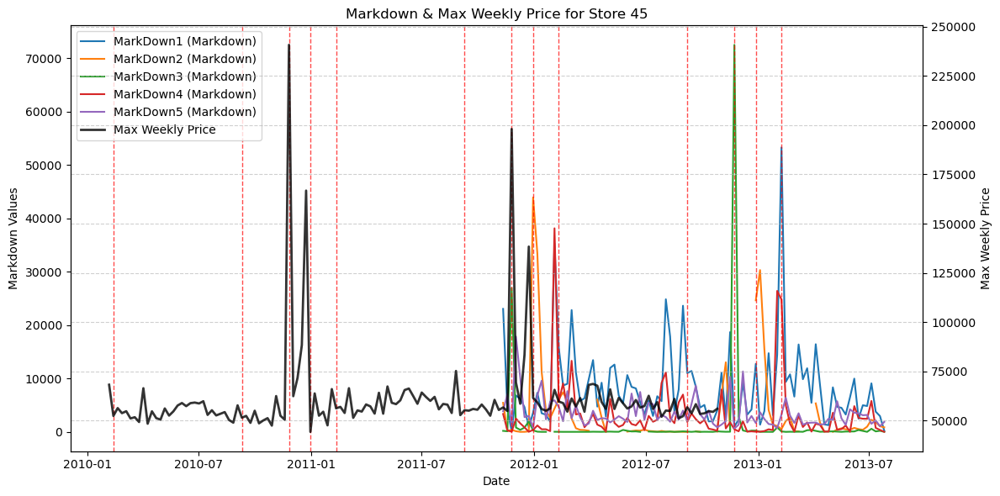

In [46]:
import matplotlib.pyplot as plt
import pandas as pd

weekly_price = dataset_train.groupby(['Store', 'Date'])['Weekly_Sales'].max().reset_index()
weekly_price.rename(columns={'Weekly_Sales': 'Max_Weekly_Sales'}, inplace=True)

dataset_features['Date']=pd.to_datetime(dataset_features['Date'])
dataset_features = dataset_features.merge(weekly_price, on=['Store', 'Date'], how='left')

print(dataset_features.isna().sum())

for store in sorted(dataset_features['Store'].unique()):
    store_df = dataset_features[dataset_features['Store'] == store]

    plt.figure(figsize=(12, 6))

    ax1 = plt.gca()
    for col in markdown_columns:
        ax1.plot(store_df['Date'], store_df[col], label=f'{col} (Markdown)', linewidth=1.5)

    ax2 = ax1.twinx()
    ax2.plot(store_df['Date'], store_df['Max_Weekly_Sales'], color='black', label='Max Weekly Price', linewidth=2, alpha=0.8)
    ax2.set_ylabel("Max Weekly Price")

    holiday_dates = store_df.loc[store_df['IsHoliday'] == True, 'Date'].unique()
    for hdate in holiday_dates:
        ax1.axvline(x=hdate, color='red', linestyle='--', alpha=0.7, linewidth=1)

    ax1.set_xlabel("Date")
    ax1.set_ylabel("Markdown Values")
    plt.title(f"Markdown & Max Weekly Price for Store {store}")

    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


#### Observation: Markdowns start from a particular Date for all the stores. Some of the markdowns experience spike across holiday while some stay unchanged and this happens for some stores while others experience nothing like this

#### Observations: 
#### Highest Markdown experienced in Store 28
#### Most relative spikes in store 30
#### Store 33 is least responsive
#### Store 37 most spikes in the Markdown 5
#### Store 43 a lot of fluctuations
#### Store 44 most spikes in the Markdown 5

#### Observations for the effect of Markdowns on the Weekly Max Sales:
#### Markdown2 and Markdown3 strongly affect the max weekly sales as compared to MarkDown 4 and MarkDown 1 which do affect it from time to time but the effect is around 25 to 50% and markdown5 rarely affects the max weekly sales

#### Creating a markdown_null feature column for the models to consider the markdown values or not

In [47]:
dataset_features['Markdown_available'] = dataset_features[['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5']].notna().any(axis=1).astype(int)

In [48]:
dataset_features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Total_MarkDown,Max_Weekly_Sales,Markdown_available
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,0.0,139884.94,0
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,0.0,143081.42,0
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,0.0,135066.75,0
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,0.0,125048.08,0
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,0.0,132945.44,0


#### Distribution of IsHoliday feature column

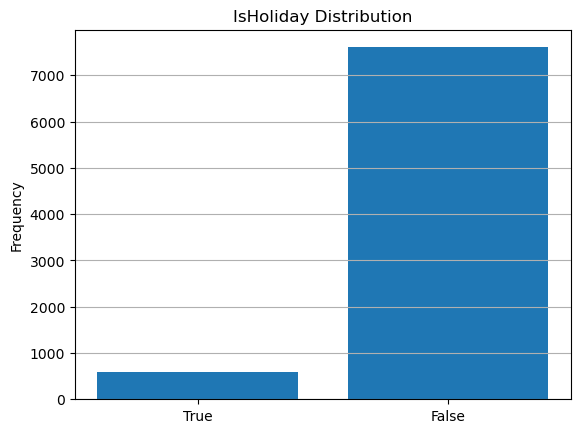

In [49]:
plt.bar(x=['True','False'],height=[dataset_features[dataset_features['IsHoliday']==True].shape[0],dataset_features[dataset_features['IsHoliday']==False].shape[0]])
plt.title("IsHoliday Distribution")
plt.ylabel("Frequency")
plt.grid(axis='y')
plt.show()

#### There is a sudden gap appearing the histogram of CPI feature column. Lets create a time line with Date to see if it is a data collection error

In [50]:
dataset_features['Date']=pd.to_datetime(dataset_features['Date'])
dataset_features=dataset_features.sort_values('Date')

C:\Windows\Temp\ipykernel_14740\3252942230.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot['Date'] = pd.to_datetime(df_plot['Date'])


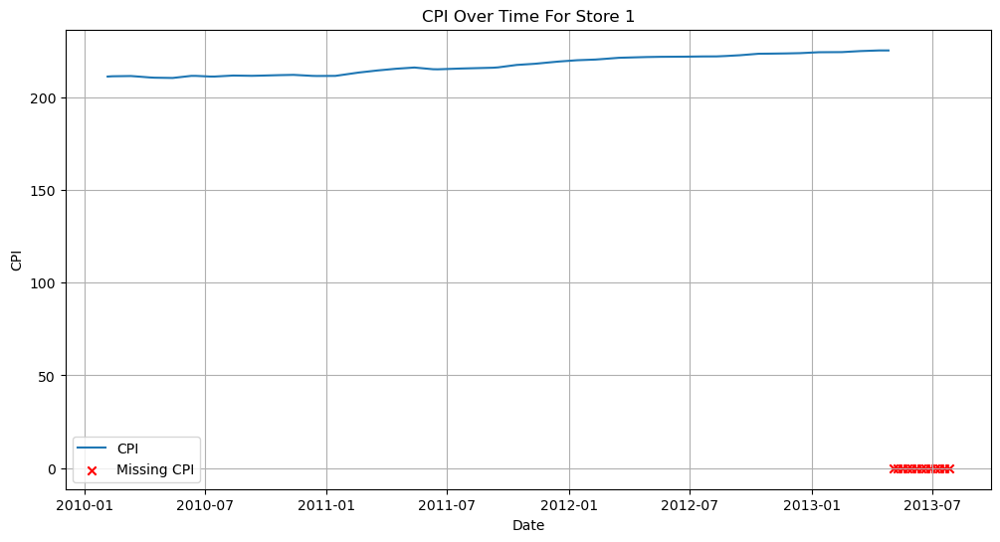

C:\Windows\Temp\ipykernel_14740\3252942230.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot['Date'] = pd.to_datetime(df_plot['Date'])


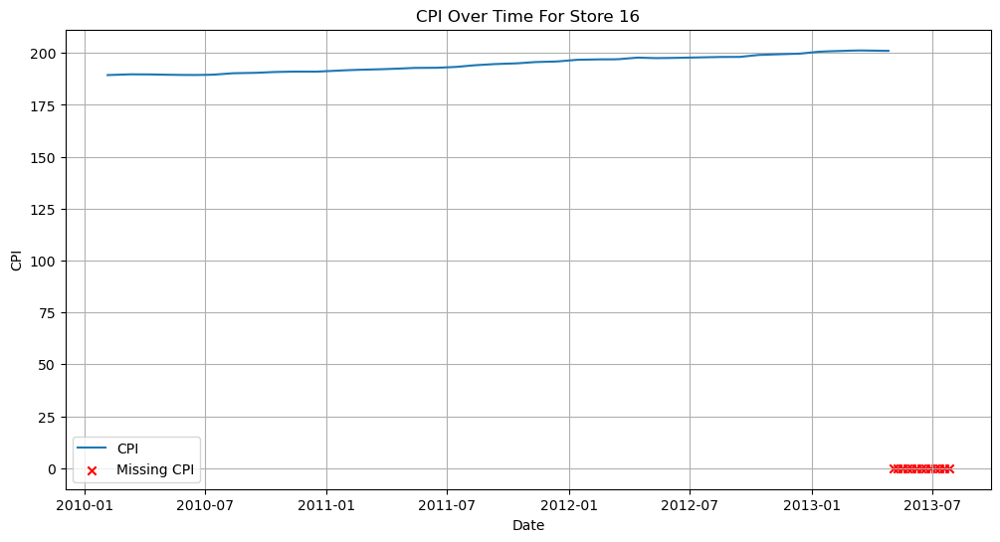

C:\Windows\Temp\ipykernel_14740\3252942230.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot['Date'] = pd.to_datetime(df_plot['Date'])


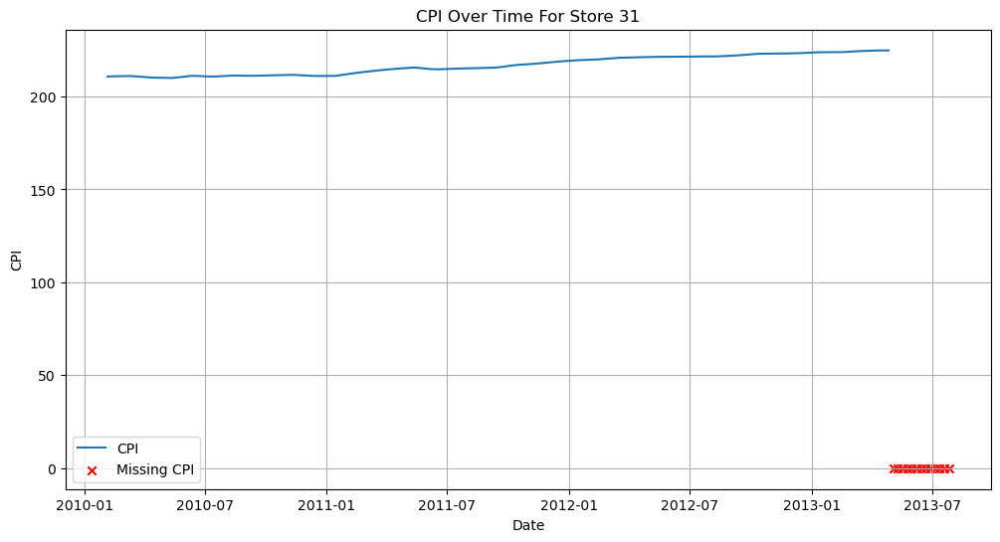

C:\Windows\Temp\ipykernel_14740\3252942230.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot['Date'] = pd.to_datetime(df_plot['Date'])


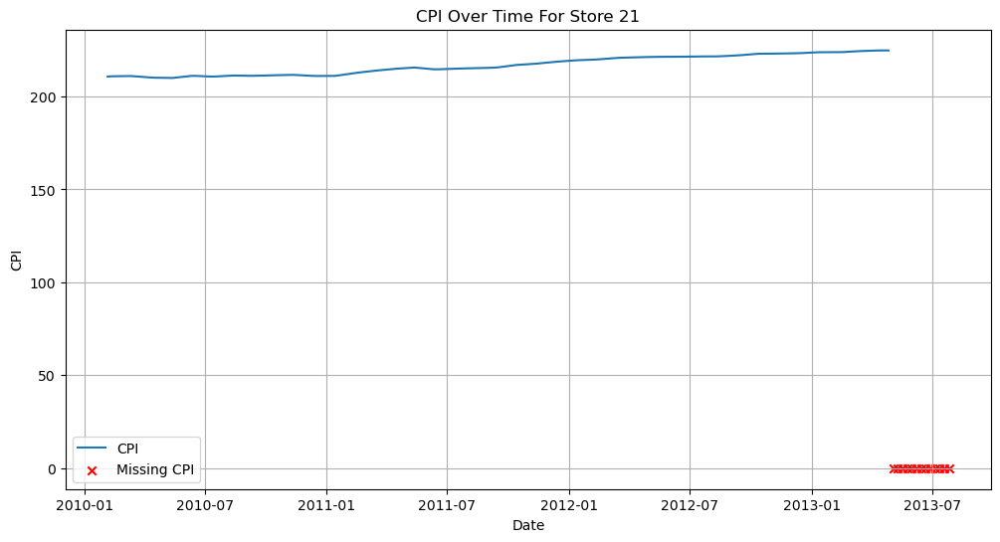

C:\Windows\Temp\ipykernel_14740\3252942230.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot['Date'] = pd.to_datetime(df_plot['Date'])


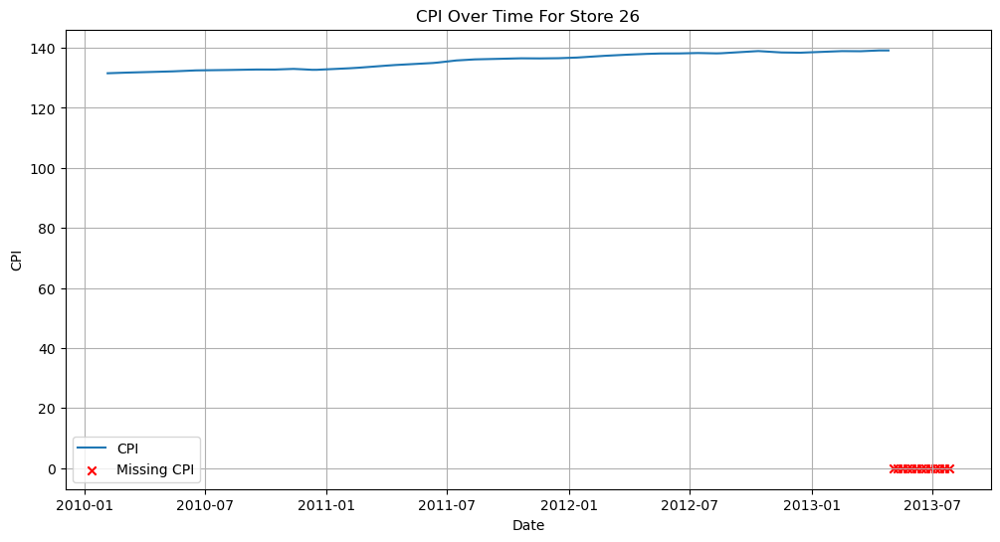

In [51]:
store_unique_values = dataset_features['Store'].unique()
cpi_missing_range_dict=dict({})

for val in store_unique_values[:5]:
    df_plot = dataset_features[dataset_features['Store'] == val]
    df_plot['Date'] = pd.to_datetime(df_plot['Date'])
    
    df_valid = df_plot[df_plot['CPI'].notna()]
    df_missing = df_plot[df_plot['CPI'].isna()]
    cpi_missing_range_dict[val]=(df_missing['Date'].min(),df_missing['Date'].max(),df_missing.shape[0])
    
    plt.figure(figsize=(12,6))
    plt.plot(df_valid['Date'], df_valid['CPI'], label='CPI')
    plt.scatter(df_missing['Date'], [0]*len(df_missing), color='red', label='Missing CPI', marker='x')
    
    plt.title(f'CPI Over Time For Store {val}')
    plt.xlabel('Date')
    plt.ylabel('CPI')
    plt.legend()
    plt.grid(True)
    plt.show()

In [52]:
df = pd.DataFrame.from_dict(dict(sorted(cpi_missing_range_dict.items())), orient='index')
print(df)

            0          1   2
1  2013-05-03 2013-07-26  13
16 2013-05-03 2013-07-26  13
21 2013-05-03 2013-07-26  13
26 2013-05-03 2013-07-26  13
31 2013-05-03 2013-07-26  13


In [53]:
13*45

585

#### This explains where the null values of the CPI feature column lies and how are those distributed.

#### We checked that there happens to be 3 categories of Type of Stores also in the histogram of Size feature column there happens to be 3 seperate distribution. Probably these 2 features can help in predicting the proper values of CPI as we observed that there are 3 startign points of CPI (between 120 to 140, 175 to 200 and between 200 and 220)

#### Lets create the dataset for training a suitable model to predict the values of CPI

In [54]:
dataset_stores=pd.read_csv('../data/raw/stores.csv')
dataset_stores.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [55]:
temp_df=dataset_features.copy()
temp_stores_df=dataset_stores.copy()
features_stores_merged_df=pd.merge(temp_df,temp_stores_df,how='left',on='Store')
features_stores_merged_df=features_stores_merged_df.sort_values(by=['Store','Date']).reset_index(drop=True)
features_stores_merged_df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Total_MarkDown,Max_Weekly_Sales,Markdown_available,Type,Size
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,0.0,139884.94,0,A,151315
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,0.0,143081.42,0,A,151315
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,0.0,135066.75,0,A,151315
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,0.0,125048.08,0,A,151315
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,0.0,132945.44,0,A,151315


In [56]:
features_stores_merged_df.isna().sum()

Store                    0
Date                     0
Temperature              0
Fuel_Price               0
MarkDown1             4158
MarkDown2             5269
MarkDown3             4577
MarkDown4             4726
MarkDown5             4140
CPI                    585
Unemployment           585
IsHoliday                0
Total_MarkDown           0
Max_Weekly_Sales      1755
Markdown_available       0
Type                     0
Size                     0
dtype: int64

In [57]:
cpi_prediction_df=features_stores_merged_df.drop(columns=['Temperature','Fuel_Price','IsHoliday'])
cpi_prediction_df.head()

,Store,Date,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Total_MarkDown,Max_Weekly_Sales,Markdown_available,Type,Size
0,1,2010-02-05,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0.0,139884.94,0,A,151315
1,1,2010-02-12,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,0.0,143081.42,0,A,151315
2,1,2010-02-19,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,0.0,135066.75,0,A,151315
3,1,2010-02-26,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,0.0,125048.08,0,A,151315
4,1,2010-03-05,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,0.0,132945.44,0,A,151315


In [58]:
cols = [col for col in cpi_prediction_df.columns if col != 'CPI'] + ['CPI']
cpi_prediction_df = cpi_prediction_df[cols]
cpi_prediction_df=cpi_prediction_df.sort_values(by=['Store','Date']).reset_index(drop=True)
cpi_prediction_df.head()

,Store,Date,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,Unemployment,Total_MarkDown,Max_Weekly_Sales,Markdown_available,Type,Size,CPI
0,1,2010-02-05,NaN,NaN,NaN,NaN,NaN,8.106,0.0,139884.94,0,A,151315,211.096358
1,1,2010-02-12,NaN,NaN,NaN,NaN,NaN,8.106,0.0,143081.42,0,A,151315,211.242170
2,1,2010-02-19,NaN,NaN,NaN,NaN,NaN,8.106,0.0,135066.75,0,A,151315,211.289143
3,1,2010-02-26,NaN,NaN,NaN,NaN,NaN,8.106,0.0,125048.08,0,A,151315,211.319643
4,1,2010-03-05,NaN,NaN,NaN,NaN,NaN,8.106,0.0,132945.44,0,A,151315,211.350143


#### Our dataset is nearly ready but depending on the candidate models, the dataset structure might change. Here now to impute the values for CPI we are going to use 1) Linear interpolations 2) ARIMA model 3)Polynomial Regression Model 4) RNN and eventually 5)LSTM (overkill perhaps)

In [59]:
cpi_prediction_df['CPI_imputed_linear'] = (
    cpi_prediction_df.groupby("Store")['CPI']
      .transform(lambda x: x.interpolate(method="linear").ffill().bfill())
)

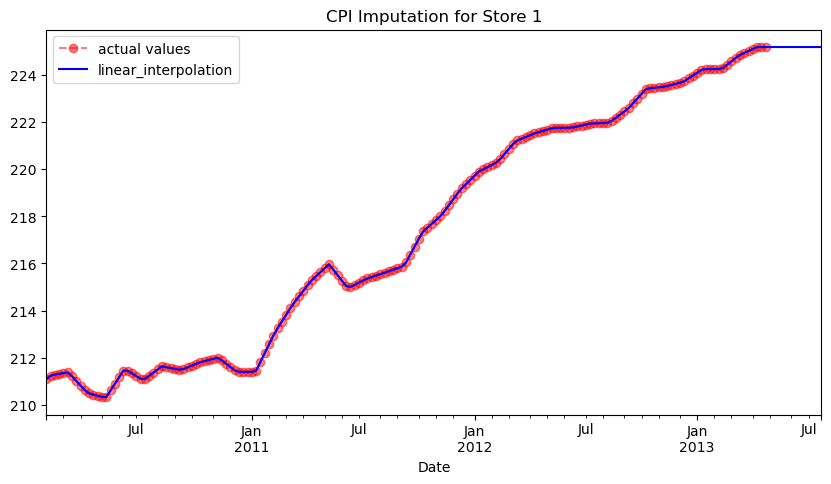

In [60]:
store_id = 1
subset = cpi_prediction_df[cpi_prediction_df['Store'] == store_id].set_index('Date')

plt.figure(figsize=(10,5))
subset['CPI'].plot(title=f'CPI Imputation for Store {store_id}',color='red',linestyle='--',marker='o',label='actual values',alpha=0.5)
subset['CPI_imputed_linear'].plot(color='blue',label='linear_interpolation')
plt.legend()
plt.show()

In [61]:
import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

cpi_prediction_df['CPI_imputed_arima'] = np.nan

for store_id in cpi_prediction_df['Store'].unique()[:5]:
    store_df = cpi_prediction_df[cpi_prediction_df['Store'] == store_id].sort_values('Date')
    ts = store_df['CPI']

    try:
        ts_filled = ts.ffill().bfill()
        p = min(16, len(ts_filled)-1)  # avoid p > series length
        model = ARIMA(ts_filled, order=(p,0,0))
        arima_result = model.fit()

        pred_series = pd.Series(arima_result.predict(start=0, end=len(ts_filled)-1, typ='levels'), index=ts.index)
        mask = ts.isna()
        cpi_prediction_df.loc[(cpi_prediction_df['Store']==store_id) & mask, 'CPI_imputed_arima'] = pred_series[mask]

    except Exception as e:
        print(f"ARIMA failed for Store {store_id}: {e}")


c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsuppor

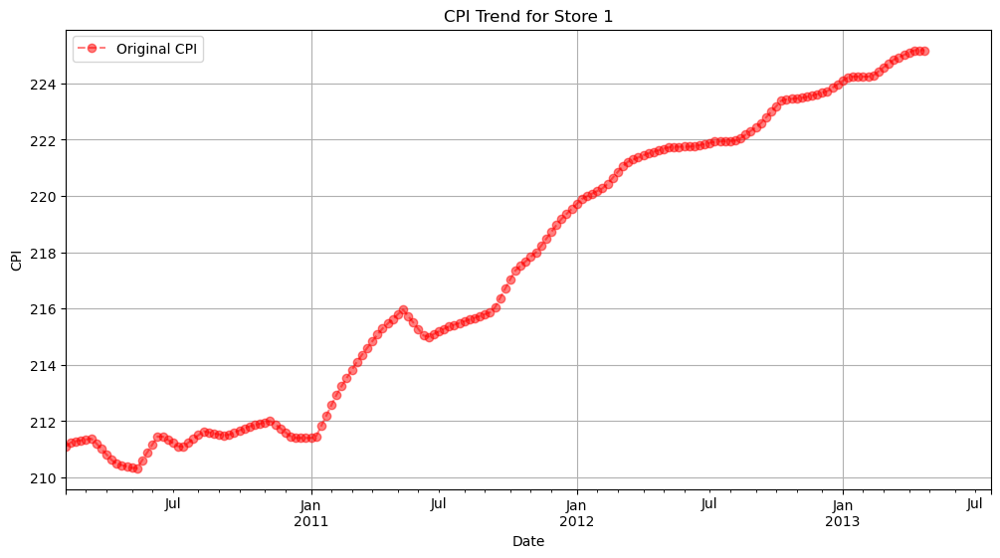

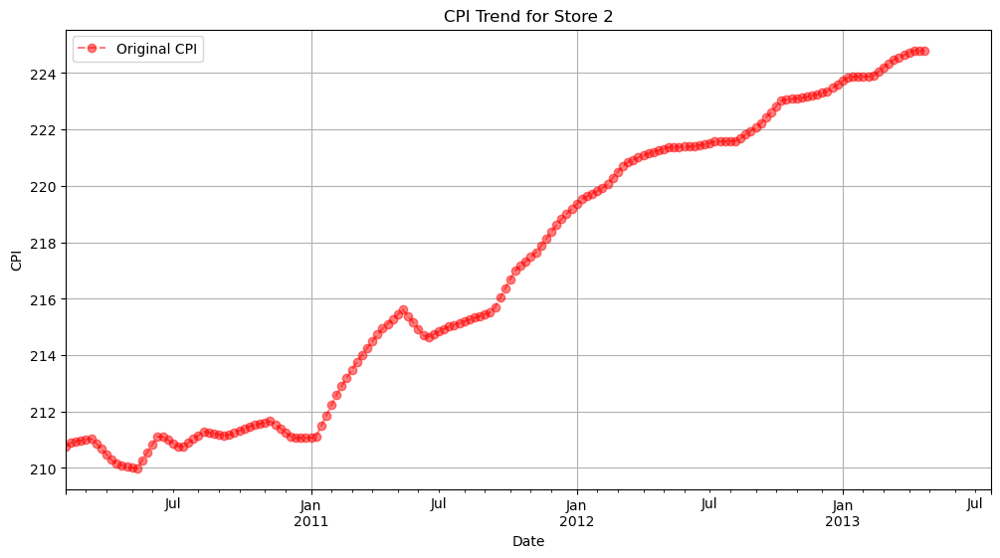

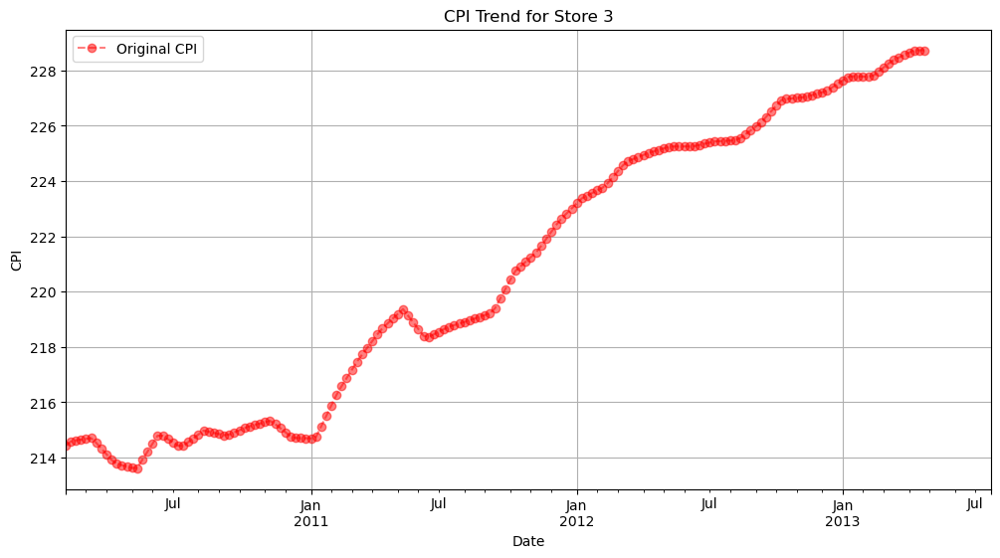

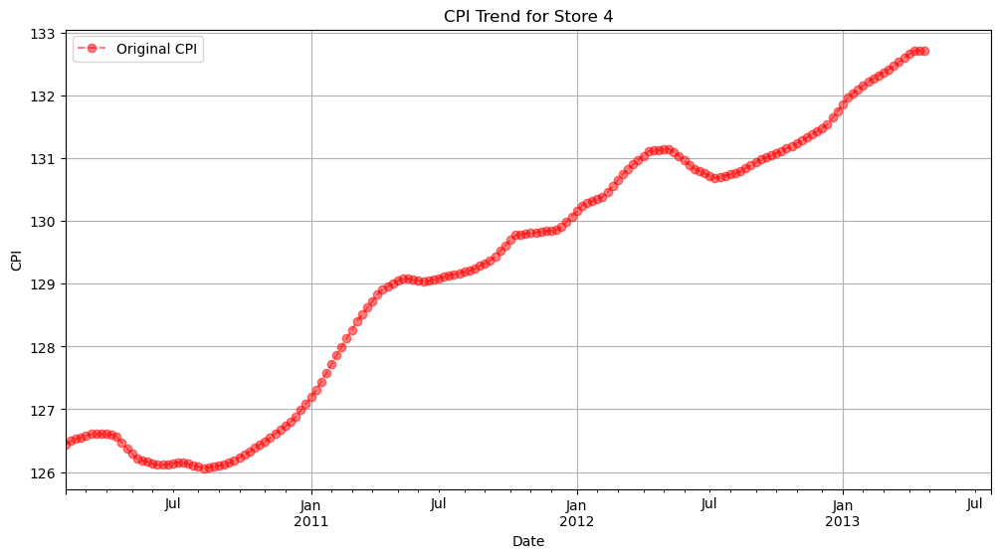

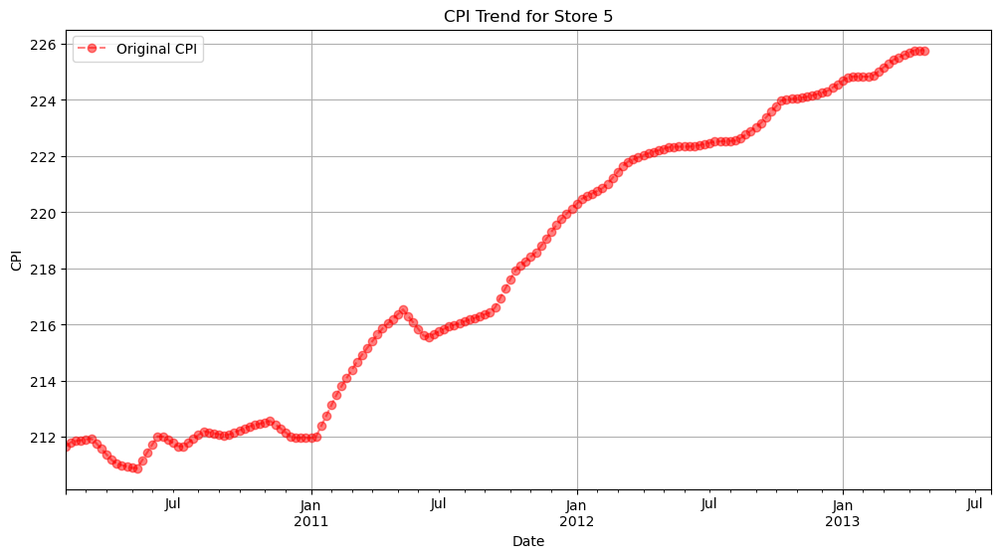

...

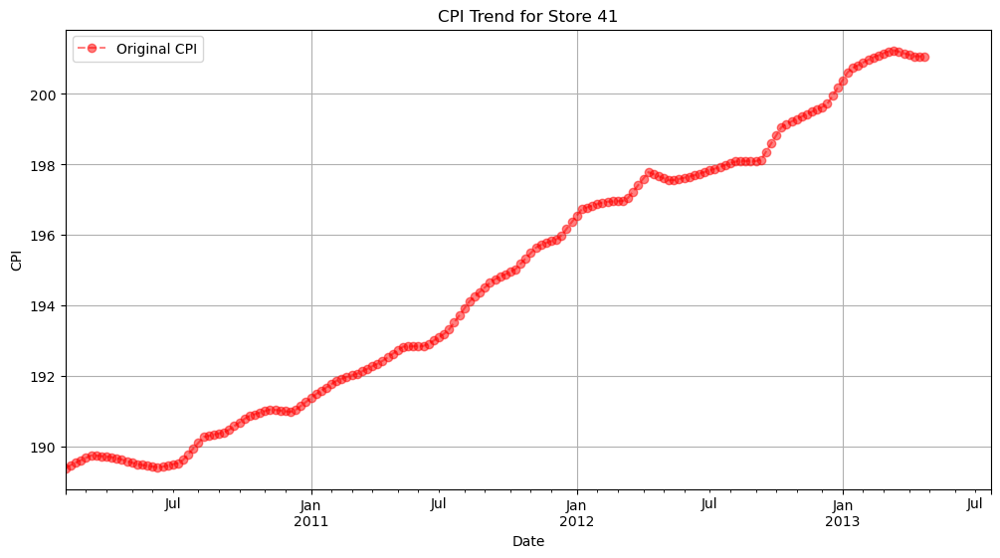

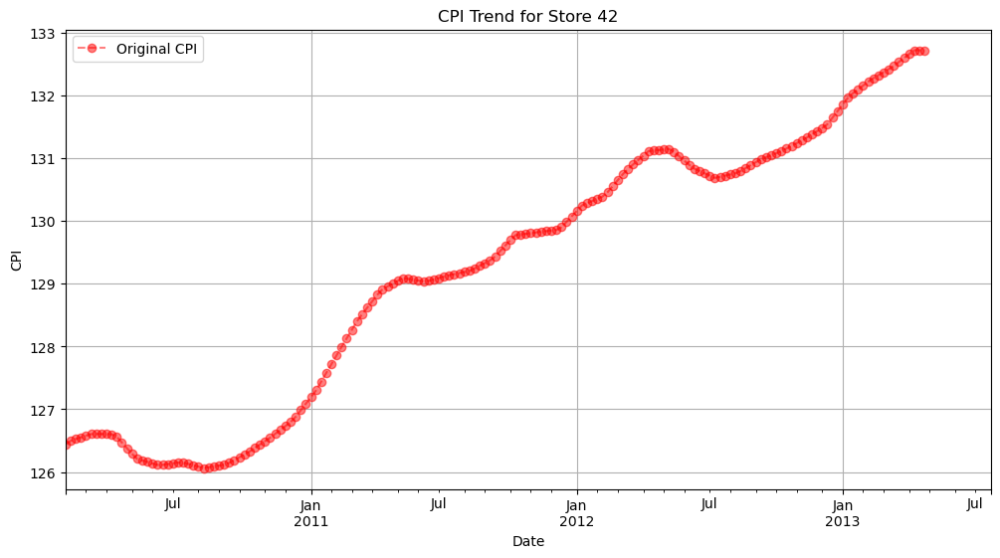

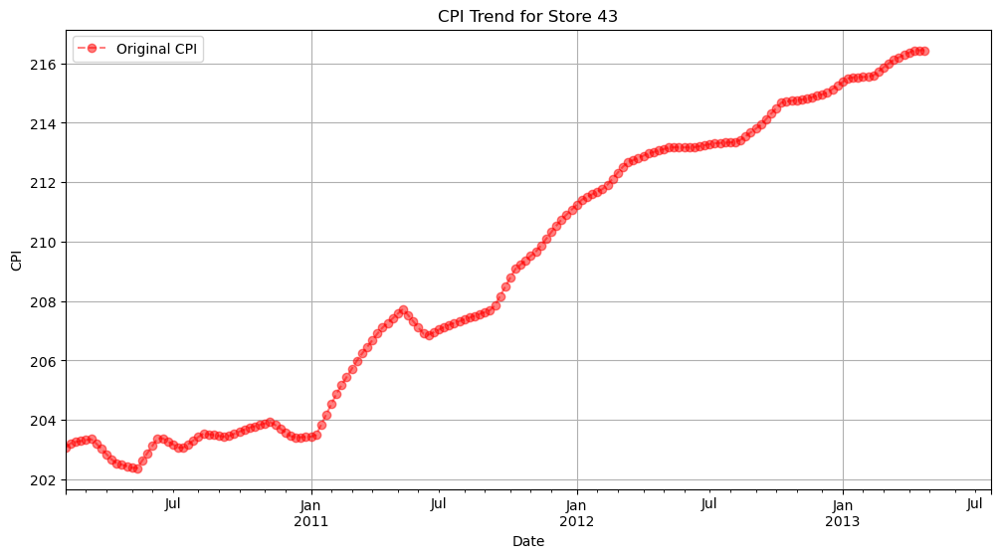

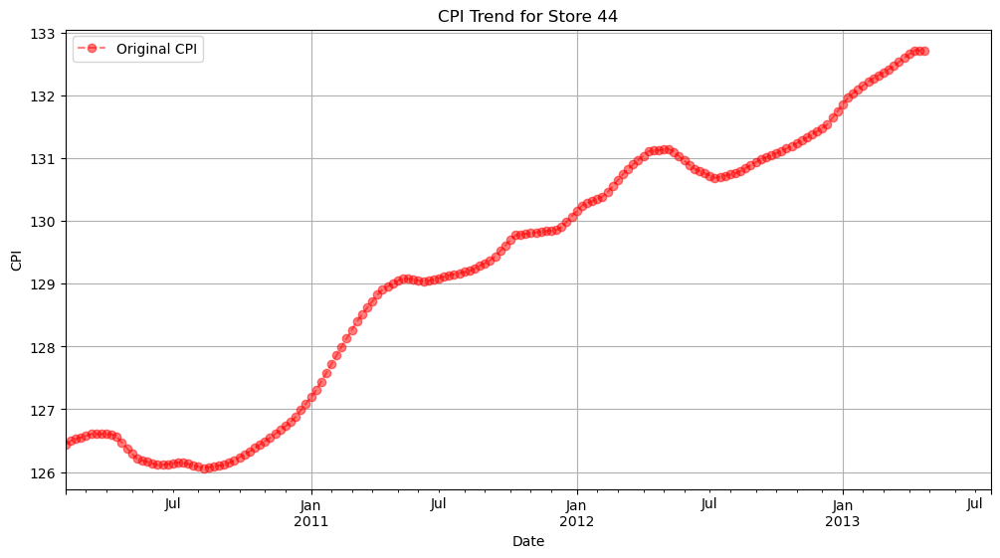

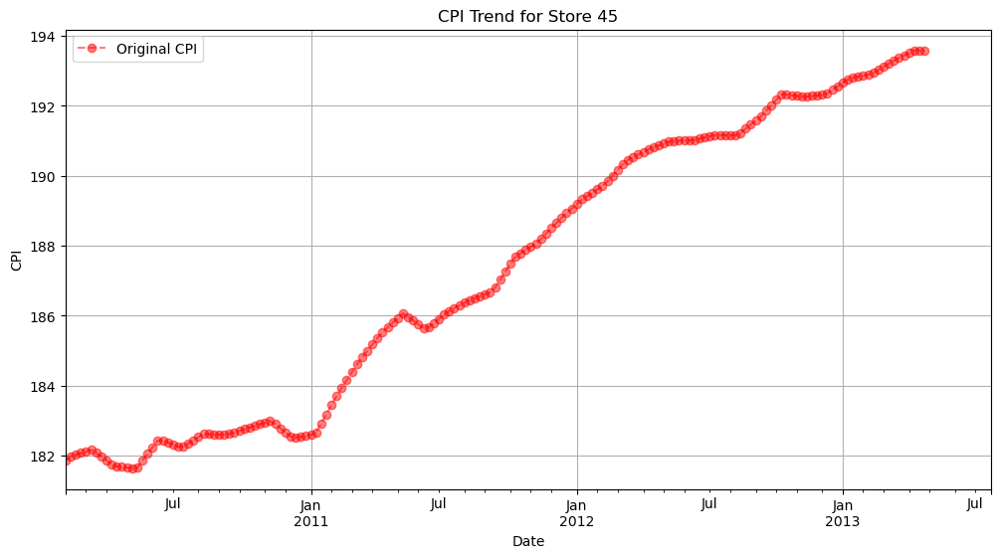

In [62]:
import matplotlib.pyplot as plt
import numpy as np

store_ids = sorted(cpi_prediction_df['Store'].unique())

for store_id in store_ids:
    subset = cpi_prediction_df[cpi_prediction_df['Store'] == store_id].sort_values('Date')
    subset = subset.set_index('Date')

    plt.figure(figsize=(12,6))
    
    subset['CPI'].plot(label='Original CPI', color='red', linestyle='--', marker='o', alpha=0.5)
    
    x_line = np.arange(len(subset))
    y_line = np.linspace(subset['CPI'].min(), subset['CPI'].max(), len(subset))
    
    plt.title(f'CPI Trend for Store {store_id}')
    plt.xlabel("Date")
    plt.ylabel("CPI")
    plt.legend()
    plt.grid(True)
    plt.show()


#### Now let us group these stores based on their CPI trends that they experience and afterwards perform polynomial regression to each group that forms for efficient imputation pipeline in the future if needed

In [63]:
# Example: pivot table with stores as rows and dates as columns
cpi_matrix = dataset_features.pivot(index='Store', columns='Date', values='CPI')
cpi_matrix_filled = cpi_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)


C:\Windows\Temp\ipykernel_14740\2105571544.py:3: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  cpi_matrix_filled = cpi_matrix.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1)


In [64]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=42)
cluster_labels = kmeans.fit_predict(cpi_matrix_filled)

# Map cluster labels back to stores
dataset_features['store_cluster'] = dataset_features['Store'].map(dict(zip(cpi_matrix.index, cluster_labels)))

c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [65]:
dataset_features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Total_MarkDown,Max_Weekly_Sales,Markdown_available,store_cluster
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,0.0,139884.94,0,1
2730,16,2010-02-05,19.79,2.580,NaN,NaN,NaN,NaN,NaN,189.381697,7.039,False,0.0,57776.81,0,2
5460,31,2010-02-05,39.05,2.572,NaN,NaN,NaN,NaN,NaN,210.752605,8.324,False,0.0,129993.58,0,1
3640,21,2010-02-05,39.05,2.572,NaN,NaN,NaN,NaN,NaN,210.752605,8.324,False,0.0,73282.66,0,1
4550,26,2010-02-05,9.55,2.788,NaN,NaN,NaN,NaN,NaN,131.527903,8.488,False,0.0,116562.22,0,3


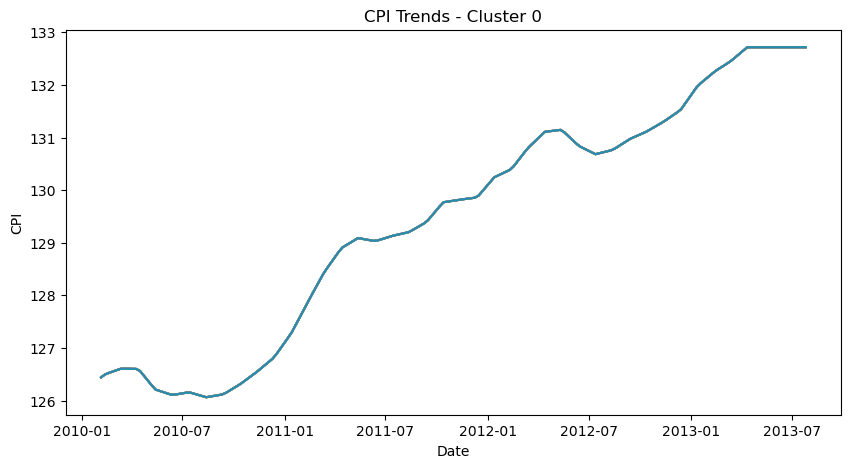

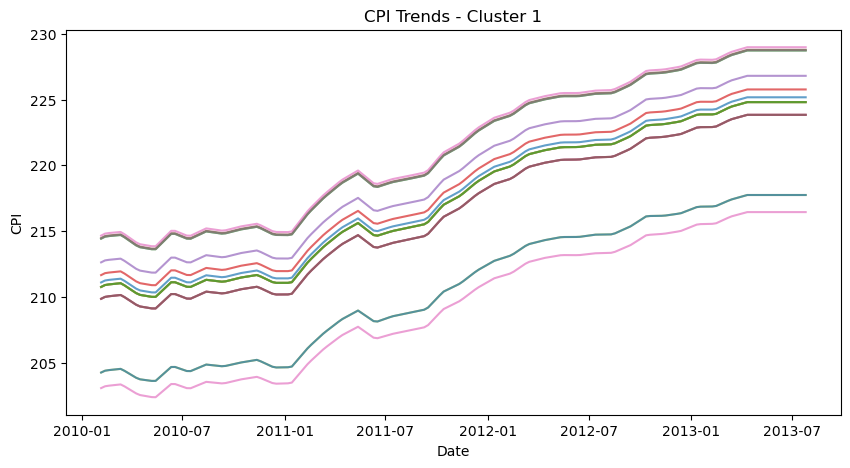

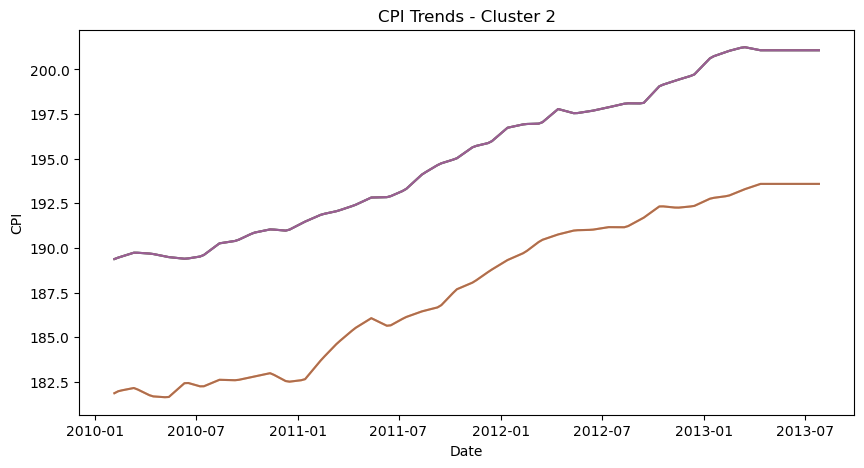

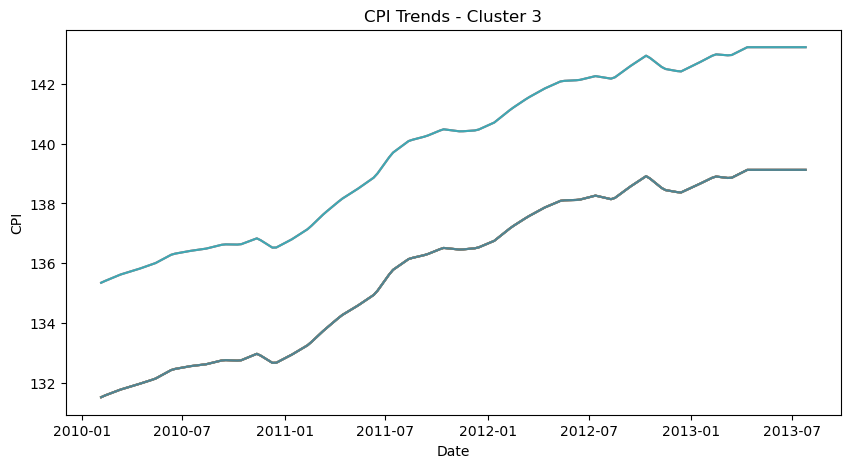

In [66]:
import matplotlib.pyplot as plt

for cluster in range(4):
    cluster_stores = cpi_matrix_filled.index[cluster_labels == cluster]
    plt.figure(figsize=(10, 5))
    for store in cluster_stores:
        plt.plot(cpi_matrix_filled.columns, cpi_matrix_filled.loc[store], alpha=0.7)
    plt.title(f'CPI Trends - Cluster {cluster}')
    plt.xlabel('Date')
    plt.ylabel('CPI')
    plt.show()

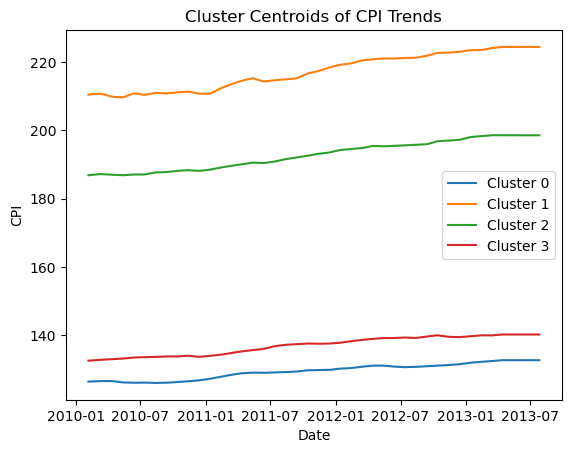

In [67]:
import numpy as np

for cluster in range(4):
    cluster_data = cpi_matrix_filled.iloc[cluster_labels == cluster]
    centroid = cluster_data.mean(axis=0)
    plt.plot(centroid, label=f'Cluster {cluster}')
plt.title('Cluster Centroids of CPI Trends')
plt.xlabel('Date')
plt.ylabel('CPI')
plt.legend()
plt.show()


#### Before doing the imputation, lets check the CPI value trend of the store depending on the type of the store they are

In [68]:
store_type_map = cpi_prediction_df[['Store', 'Type']].drop_duplicates().set_index('Store')['Type'].to_dict()
store_type_map

{1: 'A',
 2: 'A',
 3: 'B',
 4: 'A',
 5: 'B',
 6: 'A',
 7: 'B',
 8: 'A',
 9: 'B',
 10: 'B',
 11: 'A',
 12: 'B',
 13: 'A',
 14: 'A',
 15: 'B',
 16: 'B',
 17: 'B',
 18: 'B',
 19: 'A',
 20: 'A',
 21: 'B',
 22: 'B',
 23: 'B',
 24: 'A',
 25: 'B',
 26: 'A',
 27: 'A',
 28: 'A',
 29: 'B',
 30: 'C',
 31: 'A',
 32: 'A',
 33: 'A',
 34: 'A',
 35: 'B',
 36: 'A',
 37: 'C',
 38: 'C',
 39: 'A',
 40: 'A',
 41: 'A',
 42: 'C',
 43: 'C',
 44: 'C',
 45: 'B'}

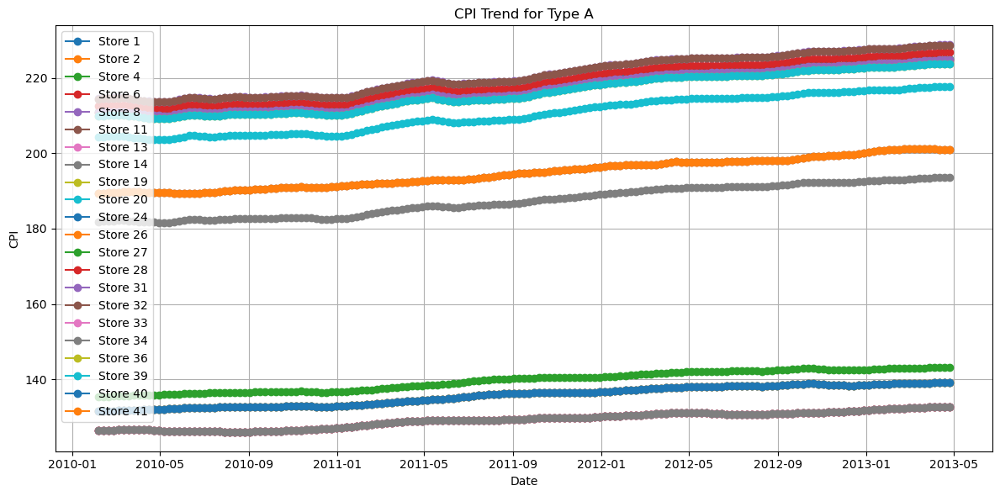

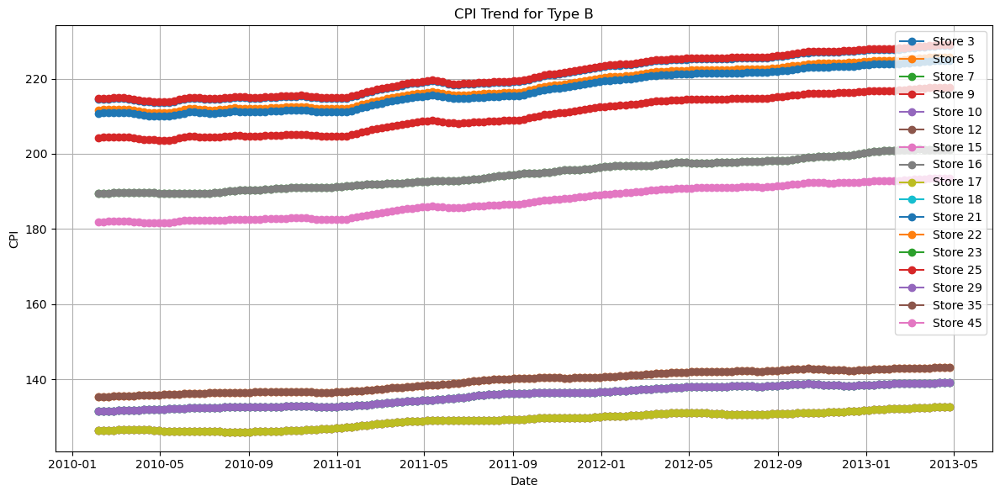

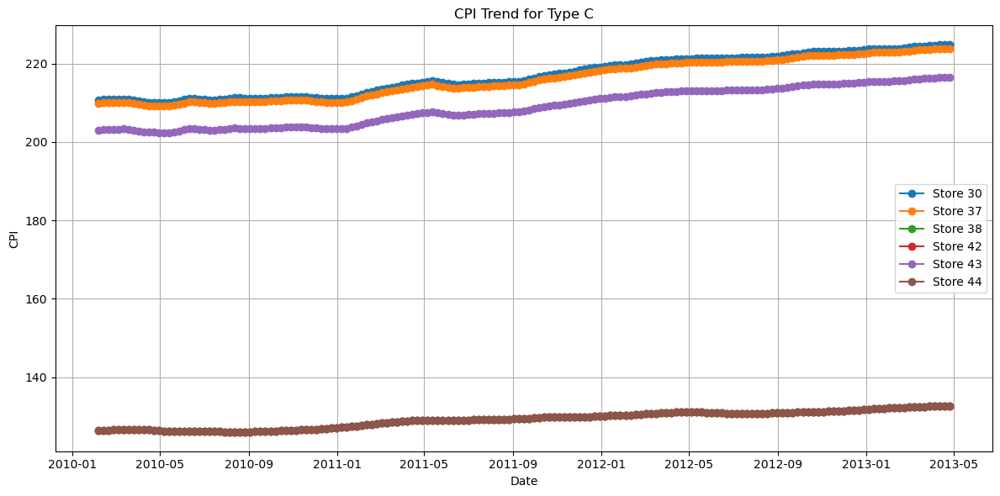

In [69]:
import matplotlib.pyplot as plt

# Get unique types
type_uniques = cpi_prediction_df['Type'].unique()

for t in type_uniques:
    plt.figure(figsize=(12, 6))
    
    # Select all stores for this type
    type_df = cpi_prediction_df[cpi_prediction_df['Type'] == t]
    stores_in_type = type_df['Store'].unique()
    
    for store_id in stores_in_type:
        store_df = type_df[type_df['Store'] == store_id].sort_values('Date')
        plt.plot(store_df['Date'], store_df['CPI'], marker='o', linestyle='-', label=f'Store {store_id}')
    
    plt.title(f'CPI Trend for Type {t}')
    plt.xlabel('Date')
    plt.ylabel('CPI')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


#### The trend for CPI looks the same for all the type values of Type feature column

#### Now lets try the polynomial linear regression model for the predictions

In [70]:
cpi_prediction_df.drop(columns=['CPI_imputed_arima'],inplace=True)
cpi_prediction_df['CPI_imputed_poly'] = np.nan
cpi_prediction_df.head()

,Store,Date,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,Unemployment,Total_MarkDown,Max_Weekly_Sales,Markdown_available,Type,Size,CPI,CPI_imputed_linear,CPI_imputed_poly
0,1,2010-02-05,NaN,NaN,NaN,NaN,NaN,8.106,0.0,139884.94,0,A,151315,211.096358,211.096358,NaN
1,1,2010-02-12,NaN,NaN,NaN,NaN,NaN,8.106,0.0,143081.42,0,A,151315,211.242170,211.242170,NaN
2,1,2010-02-19,NaN,NaN,NaN,NaN,NaN,8.106,0.0,135066.75,0,A,151315,211.289143,211.289143,NaN
3,1,2010-02-26,NaN,NaN,NaN,NaN,NaN,8.106,0.0,125048.08,0,A,151315,211.319643,211.319643,NaN
4,1,2010-03-05,NaN,NaN,NaN,NaN,NaN,8.106,0.0,132945.44,0,A,151315,211.350143,211.350143,NaN


In [71]:
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Convert dates to integers
date_nums = (cpi_matrix_filled.columns - cpi_matrix_filled.columns.min()).days


In [72]:
degree = 5  # quadratic, adjust if needed

cluster_models = {}

for cluster in range(4):
    cluster_stores = cpi_matrix_filled.index[cluster_labels == cluster]
    
    # Flatten data for regression: X = dates, y = CPI values
    X = []
    y = []
    for store in cluster_stores:
        cpi_values = cpi_matrix_filled.loc[store].values
        mask = ~np.isnan(cpi_values)
        X.extend(date_nums[mask])
        y.extend(cpi_values[mask])
        
    X = np.array(X).reshape(-1, 1)
    y = np.array(y)
    
    # Polynomial features
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)
    
    # Fit regression
    model = LinearRegression()
    model.fit(X_poly, y)
    
    # Save model for this cluster
    cluster_models[cluster] = (model, poly)


In [73]:
for cluster in range(4):
    model, poly = cluster_models[cluster]
    cluster_stores = cpi_matrix_filled.index[cluster_labels == cluster]
    
    for store in cluster_stores:
        cpi_values = cpi_matrix_filled.loc[store].values
        missing_mask = np.isnan(cpi_values)
        if missing_mask.any():
            X_missing = date_nums[missing_mask].reshape(-1,1)
            X_missing_poly = poly.transform(X_missing)
            cpi_matrix_filled.loc[store, missing_mask] = model.predict(X_missing_poly)


#### Visualizations for the Polynomial Regression process

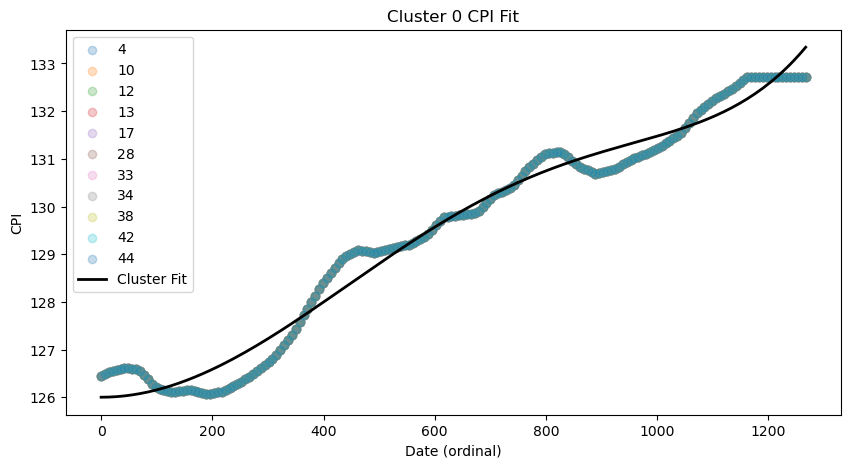

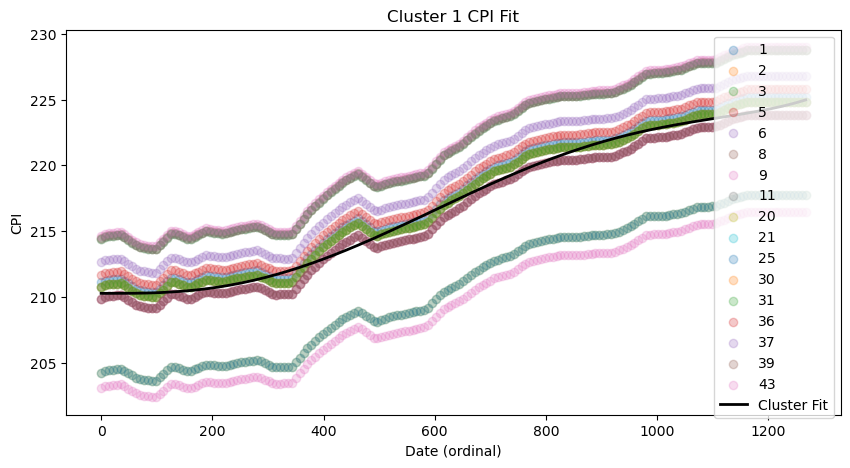

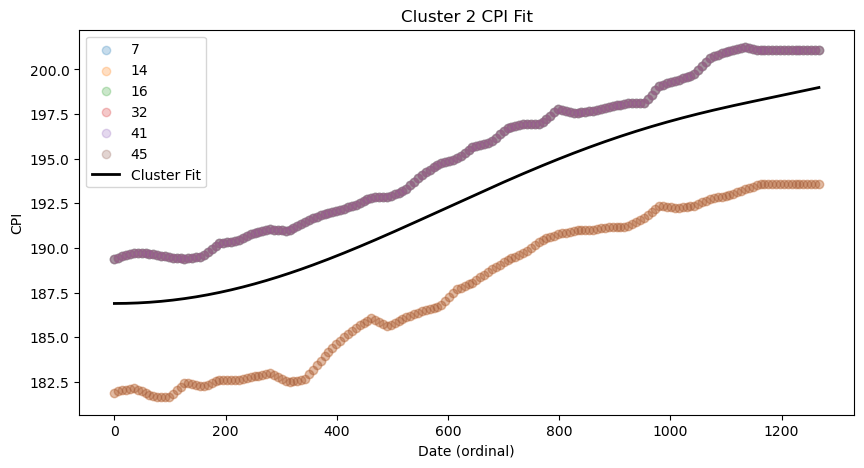

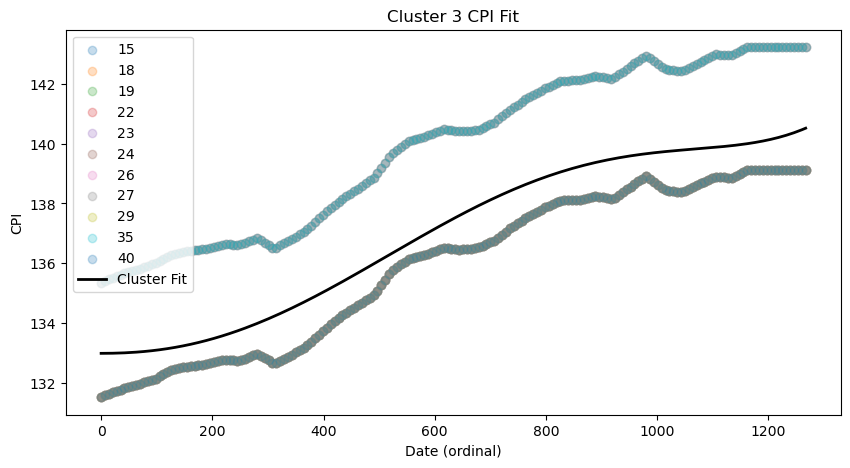

In [74]:
import matplotlib.pyplot as plt
import numpy as np

# Convert date_nums (Index) to a NumPy array once
date_nums_array = np.array(date_nums)

for cluster in range(4):
    model, poly = cluster_models[cluster]
    cluster_stores = cpi_matrix_filled.index[cluster_labels == cluster]
    
    plt.figure(figsize=(10,5))
    
    # Plot CPI values for each store in the cluster
    for store in cluster_stores:
        cpi_values = cpi_matrix_filled.loc[store].values
        plt.scatter(date_nums_array, cpi_values, alpha=0.25, label=f'{store}')
    
    # Plot cluster polynomial regression fit
    X_poly = poly.transform(date_nums_array.reshape(-1,1))
    y_pred = model.predict(X_poly)
    plt.plot(date_nums_array, y_pred, color='black', linewidth=2, label='Cluster Fit')
    
    plt.title(f'Cluster {cluster} CPI Fit')
    plt.xlabel('Date (ordinal)')
    plt.ylabel('CPI')
    plt.legend()
    plt.show()


#### Some of the stores in cluster 2 are mis clustered so we need to reassign the cluster labels to them

In [75]:
import numpy as np

cluster_centroids = {}
for cluster in range(4):
    cluster_stores = cpi_matrix_filled.index[cluster_labels == cluster]
    cluster_centroids[cluster] = cpi_matrix_filled.loc[cluster_stores].mean(axis=0)


In [76]:
from scipy.spatial.distance import euclidean

# Store distances from their cluster centroid
store_distances = {}

for cluster in range(4):
    cluster_stores = cpi_matrix_filled.index[cluster_labels == cluster]
    centroid = cluster_centroids[cluster].values
    for store in cluster_stores:
        store_cpi = cpi_matrix_filled.loc[store].values
        dist = euclidean(store_cpi, centroid)
        store_distances[store] = dist

# Sort stores by distance within cluster 2
cluster2_stores = [s for s, lbl in zip(cpi_matrix_filled.index, cluster_labels) if lbl == 2]
distances_cluster2 = {s: store_distances[s] for s in cluster2_stores}
sorted_distances = sorted(distances_cluster2.items(), key=lambda x: x[1], reverse=True)

print("Potential misclustered stores in Cluster 2 (largest distance first):")
for store, dist in sorted_distances:
    print(store, dist)


Potential misclustered stores in Cluster 2 (largest distance first):
14 66.93540173709611
45 66.93540173709611
7 33.46770086854806
16 33.46770086854806
32 33.46770086854806
41 33.46770086854806


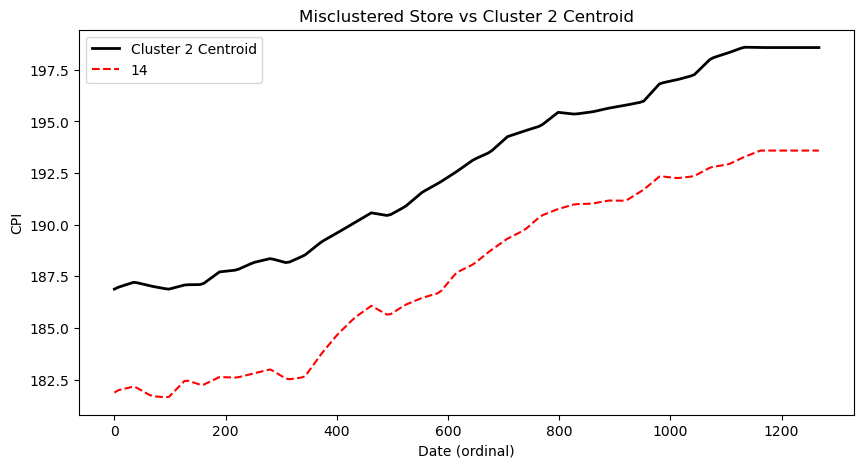

In [77]:
misclustered_store = sorted_distances[0][0]  # store with largest distance
plt.figure(figsize=(10,5))
plt.plot(date_nums_array, cluster_centroids[2], color='black', linewidth=2, label='Cluster 2 Centroid')
plt.plot(date_nums_array, cpi_matrix_filled.loc[misclustered_store], color='red', linestyle='--', label=f'{misclustered_store}')
plt.title('Misclustered Store vs Cluster 2 Centroid')
plt.xlabel('Date (ordinal)')
plt.ylabel('CPI')
plt.legend()
plt.show()

#### We now know that store number 14 and 45 are misclustered and now need to be reassigned to the cluster 1

In [78]:
# Reassign manually
dataset_features.loc[dataset_features['Store'].isin([14, 45]), 'store_cluster'] = 1

#### Now lets perform the polynomial regression on each of the clusters

In [79]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

cpi_normalized = cpi_matrix_filled.copy()
scalers = {}

for store in cpi_matrix_filled.index:
    scaler = MinMaxScaler()
    values = cpi_matrix_filled.loc[store].values.reshape(-1,1)  # shape (n_dates, 1)
    mask = ~np.isnan(values).flatten()  # boolean mask
    
    scaled = np.full(values.shape, np.nan)  # placeholder
    # Fit-transform only on non-NaN values
    scaled[mask] = scaler.fit_transform(values[mask].reshape(-1,1))  # reshape for 2D
    
    cpi_normalized.loc[store] = scaled.flatten()  # back to 1D
    scalers[store] = scaler  # save scaler for inverse transform


In [80]:
degree = 5
cluster_models = {}

for cluster in range(4):
    cluster_stores = dataset_features.loc[dataset_features['store_cluster']==cluster, 'Store']
    
    X = []
    y = []
    for store in cluster_stores:
        cpi_values = cpi_normalized.loc[store].values
        mask = ~np.isnan(cpi_values)
        X.extend(date_nums_array[mask])
        y.extend(cpi_values[mask])
    
    X = np.array(X).reshape(-1,1)
    y = np.array(y)
    
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)
    
    model = LinearRegression()
    model.fit(X_poly, y)
    
    cluster_models[cluster] = (model, poly)


In [81]:
dataset_features['CPI_imputed_poly'] = dataset_features['CPI'].copy()

for cluster in range(4):
    model, poly = cluster_models[cluster]
    cluster_stores = dataset_features.loc[dataset_features['store_cluster'] == cluster, 'Store']
    
    for store in cluster_stores:
        # Identify missing CPI values
        missing_mask = dataset_features.loc[dataset_features['Store'] == store, 'CPI'].isna()
        if missing_mask.any():
            # Dates corresponding to missing values
            X_missing = date_nums_array[missing_mask.values].reshape(-1,1)
            X_missing_poly = poly.transform(X_missing)
            
            # Predict normalized CPI and inverse transform to original scale
            predicted_normalized = model.predict(X_missing_poly)
            predicted_actual = scalers[store].inverse_transform(predicted_normalized.reshape(-1,1)).flatten()
            
            # Fill only the missing entries in the new column
            dataset_features.loc[(dataset_features['Store'] == store) & (dataset_features['CPI'].isna()), 'CPI_imputed_poly'] = predicted_actual


In [82]:
dataset_features.isna().sum()

Store                    0
Date                     0
Temperature              0
Fuel_Price               0
MarkDown1             4158
MarkDown2             5269
MarkDown3             4577
MarkDown4             4726
MarkDown5             4140
CPI                    585
Unemployment           585
IsHoliday                0
Total_MarkDown           0
Max_Weekly_Sales      1755
Markdown_available       0
store_cluster            0
CPI_imputed_poly         0
dtype: int64

In [83]:
dataset_features['CPI']=dataset_features['CPI_imputed_poly']
dataset_features.drop(columns=['store_cluster'],inplace=True)

In [84]:
dataset_features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Total_MarkDown,Max_Weekly_Sales,Markdown_available,CPI_imputed_poly
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,0.0,139884.94,0,211.096358
2730,16,2010-02-05,19.79,2.580,NaN,NaN,NaN,NaN,NaN,189.381697,7.039,False,0.0,57776.81,0,189.381697
5460,31,2010-02-05,39.05,2.572,NaN,NaN,NaN,NaN,NaN,210.752605,8.324,False,0.0,129993.58,0,210.752605
3640,21,2010-02-05,39.05,2.572,NaN,NaN,NaN,NaN,NaN,210.752605,8.324,False,0.0,73282.66,0,210.752605
4550,26,2010-02-05,9.55,2.788,NaN,NaN,NaN,NaN,NaN,131.527903,8.488,False,0.0,116562.22,0,131.527903


#### Lets try if the Size feature column can help us in this

In [85]:
len(cpi_prediction_df['Size'].unique())
size_counts = cpi_prediction_df['Size'].value_counts()
print(size_counts)

Size
39690     546
39910     546
203819    364
151315    182
34875     182
202307    182
37392     182
205863    182
155078    182
70713     182
202505    182
125833    182
219622    182
200898    182
207499    182
126512    182
57197     182
93188     182
120653    182
203742    182
140167    182
119557    182
123737    182
112238    182
128107    182
114533    182
206302    182
152513    182
93638     182
42988     182
203750    182
204184    182
203007    182
158114    182
103681    182
184109    182
155083    182
196321    182
41062     182
118221    182
Name: count, dtype: int64


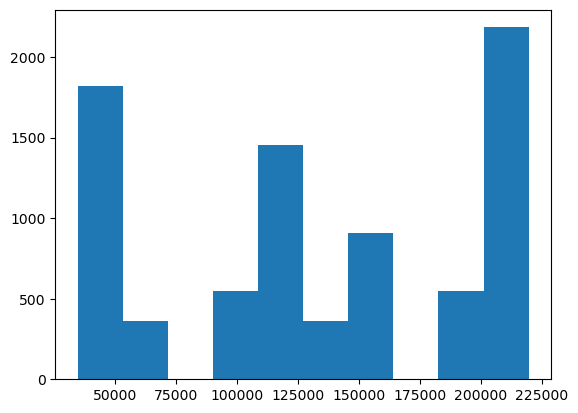

In [86]:
plt.hist(cpi_prediction_df['Size'])
plt.show()

#### Lets try bucketing Size for CPI prediction to check if it helps

In [87]:
import pandas as pd

bucket_edges = [0, 75000, 175000, cpi_prediction_df['Size'].max()+1]  # +1 ensures max value is included
bucket_labels = ['Small', 'Medium', 'Large']

cpi_prediction_df['Size_bucket'] = pd.cut(cpi_prediction_df['Size'], bins=bucket_edges, labels=bucket_labels, include_lowest=True)
cpi_prediction_df.head()

,Store,Date,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,Unemployment,Total_MarkDown,Max_Weekly_Sales,Markdown_available,Type,Size,CPI,CPI_imputed_linear,CPI_imputed_poly,Size_bucket
0,1,2010-02-05,NaN,NaN,NaN,NaN,NaN,8.106,0.0,139884.94,0,A,151315,211.096358,211.096358,NaN,Medium
1,1,2010-02-12,NaN,NaN,NaN,NaN,NaN,8.106,0.0,143081.42,0,A,151315,211.242170,211.242170,NaN,Medium
2,1,2010-02-19,NaN,NaN,NaN,NaN,NaN,8.106,0.0,135066.75,0,A,151315,211.289143,211.289143,NaN,Medium
3,1,2010-02-26,NaN,NaN,NaN,NaN,NaN,8.106,0.0,125048.08,0,A,151315,211.319643,211.319643,NaN,Medium
4,1,2010-03-05,NaN,NaN,NaN,NaN,NaN,8.106,0.0,132945.44,0,A,151315,211.350143,211.350143,NaN,Medium


#### Now lets check if this bucket process helped us or not

In [88]:
# Option 1: If Size is static per store
store_size_map = cpi_prediction_df[['Store', 'Size_bucket']].drop_duplicates().set_index('Store')['Size_bucket'].to_dict()
print(store_size_map)

{1: 'Medium', 2: 'Large', 3: 'Small', 4: 'Large', 5: 'Small', 6: 'Large', 7: 'Small', 8: 'Medium', 9: 'Medium', 10: 'Medium', 11: 'Large', 12: 'Medium', 13: 'Large', 14: 'Large', 15: 'Medium', 16: 'Small', 17: 'Medium', 18: 'Medium', 19: 'Large', 20: 'Large', 21: 'Medium', 22: 'Medium', 23: 'Medium', 24: 'Large', 25: 'Medium', 26: 'Medium', 27: 'Large', 28: 'Large', 29: 'Medium', 30: 'Small', 31: 'Large', 32: 'Large', 33: 'Small', 34: 'Medium', 35: 'Medium', 36: 'Small', 37: 'Small', 38: 'Small', 39: 'Large', 40: 'Medium', 41: 'Large', 42: 'Small', 43: 'Small', 44: 'Small', 45: 'Medium'}


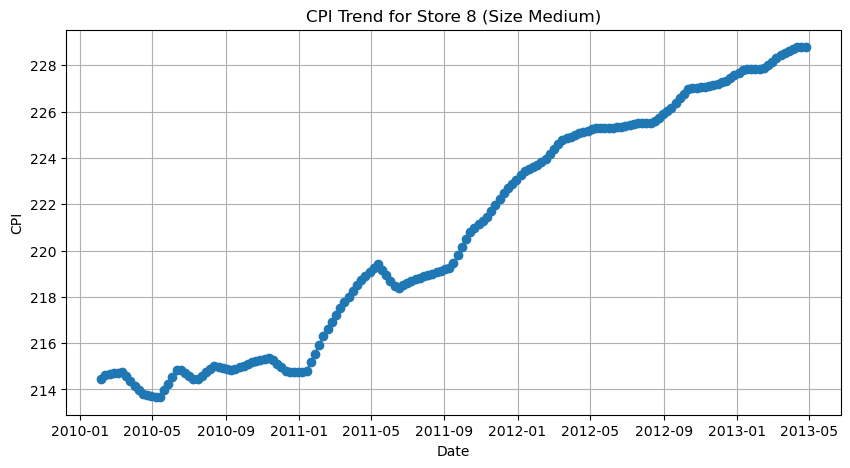

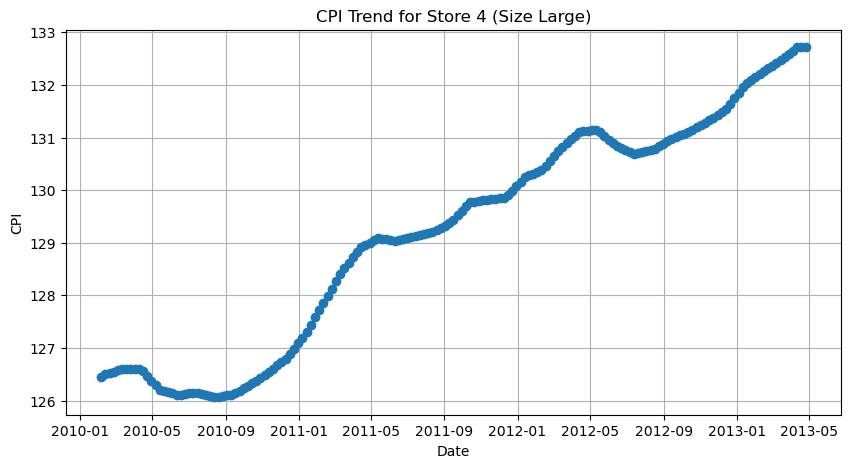

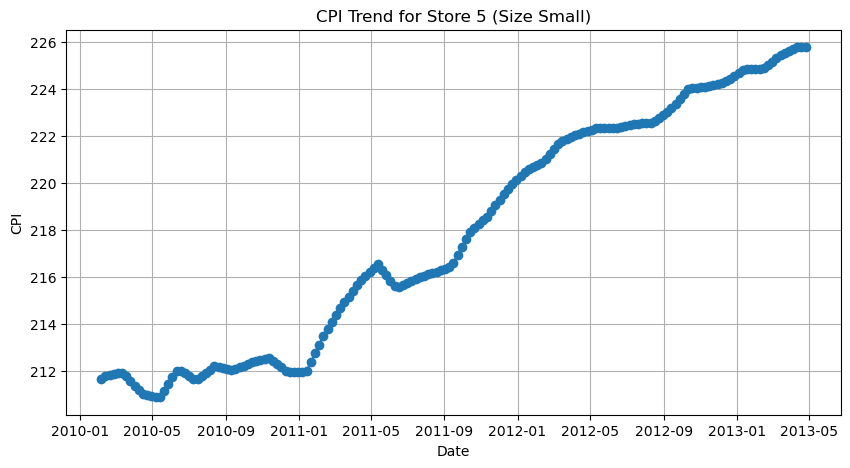

In [89]:
import matplotlib.pyplot as plt
size_types=cpi_prediction_df['Size_bucket'].unique()

for t in size_types:
    store_id=-1
    if t=='Small':
        store_id=5
    elif t=='Medium':
        store_id=8
    else:
        store_id=4
    subset_df=cpi_prediction_df[(cpi_prediction_df['Size_bucket']==t) & (cpi_prediction_df['Store']==store_id)].sort_values(by=['Date']).reset_index(drop=True)


    plt.figure(figsize=(10, 5))
    plt.plot(subset_df['Date'], subset_df['CPI'], marker='o', linestyle='-')
    plt.title(f'CPI Trend for Store {store_id} (Size {t})')
    plt.xlabel('Date')
    plt.ylabel('CPI')
    plt.grid(True)
    plt.show()


In [90]:
cpi_prediction_df.drop(columns=['Size_bucket'],inplace=True)
cpi_prediction_df.head()

,Store,Date,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,Unemployment,Total_MarkDown,Max_Weekly_Sales,Markdown_available,Type,Size,CPI,CPI_imputed_linear,CPI_imputed_poly
0,1,2010-02-05,NaN,NaN,NaN,NaN,NaN,8.106,0.0,139884.94,0,A,151315,211.096358,211.096358,NaN
1,1,2010-02-12,NaN,NaN,NaN,NaN,NaN,8.106,0.0,143081.42,0,A,151315,211.242170,211.242170,NaN
2,1,2010-02-19,NaN,NaN,NaN,NaN,NaN,8.106,0.0,135066.75,0,A,151315,211.289143,211.289143,NaN
3,1,2010-02-26,NaN,NaN,NaN,NaN,NaN,8.106,0.0,125048.08,0,A,151315,211.319643,211.319643,NaN
4,1,2010-03-05,NaN,NaN,NaN,NaN,NaN,8.106,0.0,132945.44,0,A,151315,211.350143,211.350143,NaN


#### Now lets deal with the case of having null values under the Unemployment feature column. First lets see the number of null values again 

In [91]:
dataset_features.isna().sum()

Store                    0
Date                     0
Temperature              0
Fuel_Price               0
MarkDown1             4158
MarkDown2             5269
MarkDown3             4577
MarkDown4             4726
MarkDown5             4140
CPI                      0
Unemployment           585
IsHoliday                0
Total_MarkDown           0
Max_Weekly_Sales      1755
Markdown_available       0
CPI_imputed_poly         0
dtype: int64

In [92]:
features_stores_merged_df['CPI']=dataset_features['CPI']
features_stores_merged_df.isna().sum()

Store                    0
Date                     0
Temperature              0
Fuel_Price               0
MarkDown1             4158
MarkDown2             5269
MarkDown3             4577
MarkDown4             4726
MarkDown5             4140
CPI                      0
Unemployment           585
IsHoliday                0
Total_MarkDown           0
Max_Weekly_Sales      1755
Markdown_available       0
Type                     0
Size                     0
dtype: int64

#### Same number as that of CPI

In [93]:
dataset_features[(dataset_features['CPI'].isna())&(dataset_features['Unemployment'].isna())].head()
dataset_features[(dataset_features['CPI'].isna())&(dataset_features['Unemployment'].isna())].shape


(0, 16)

#### Wow again just like CPI the Unemployment feature columns is null exactly on those records where CPI happens to be null. Lets check the distribution of the Unemployment feature column

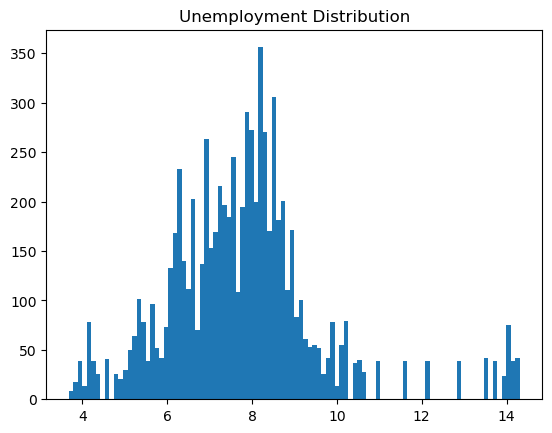

In [94]:
plt.hist(dataset_features['Unemployment'],bins=100)
plt.title("Unemployment Distribution")
plt.show()

#### Also lets check the time series plot of unemployment for all the stores

C:\Windows\Temp\ipykernel_14740\2776730321.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  null_df['Unemployment']=null_df['Unemployment'].fillna(0)


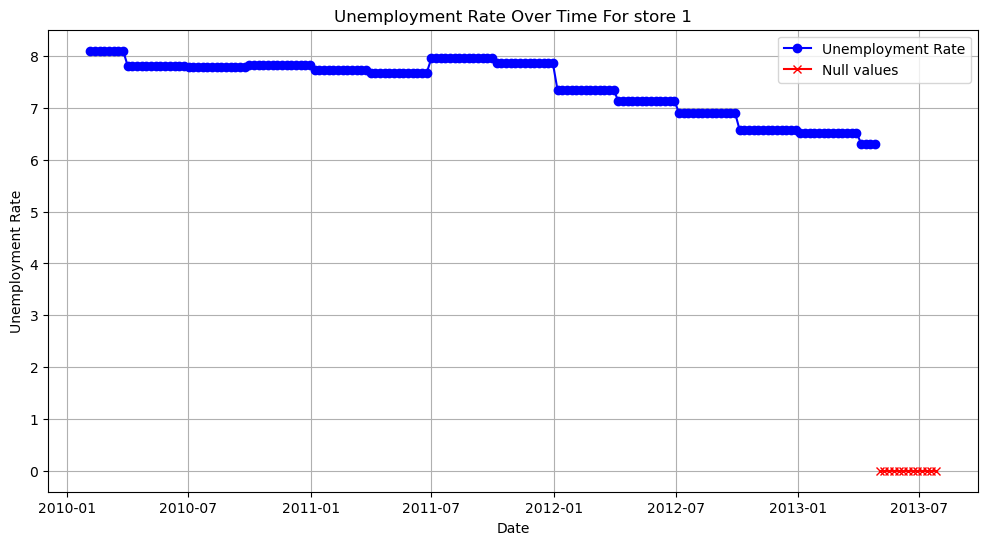

C:\Windows\Temp\ipykernel_14740\2776730321.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  null_df['Unemployment']=null_df['Unemployment'].fillna(0)


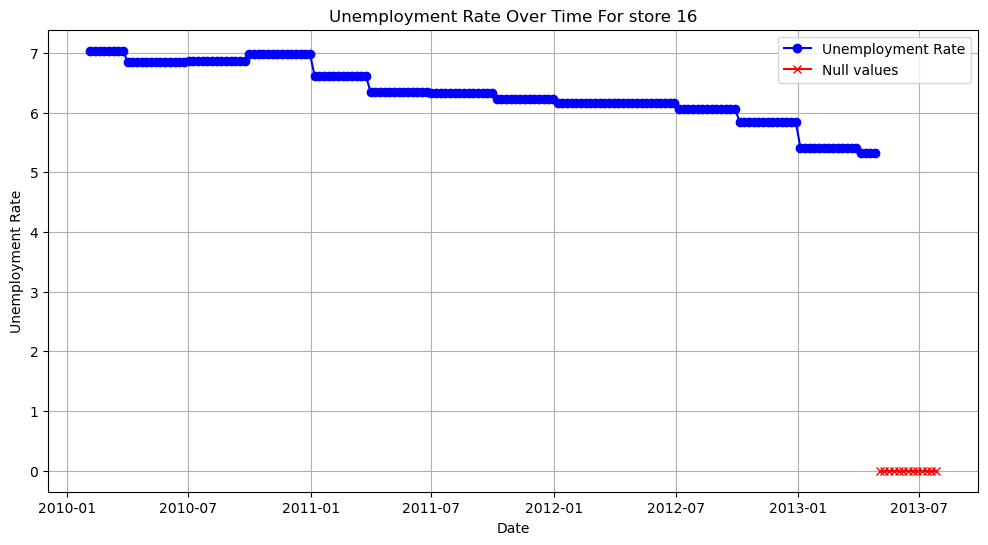

C:\Windows\Temp\ipykernel_14740\2776730321.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  null_df['Unemployment']=null_df['Unemployment'].fillna(0)


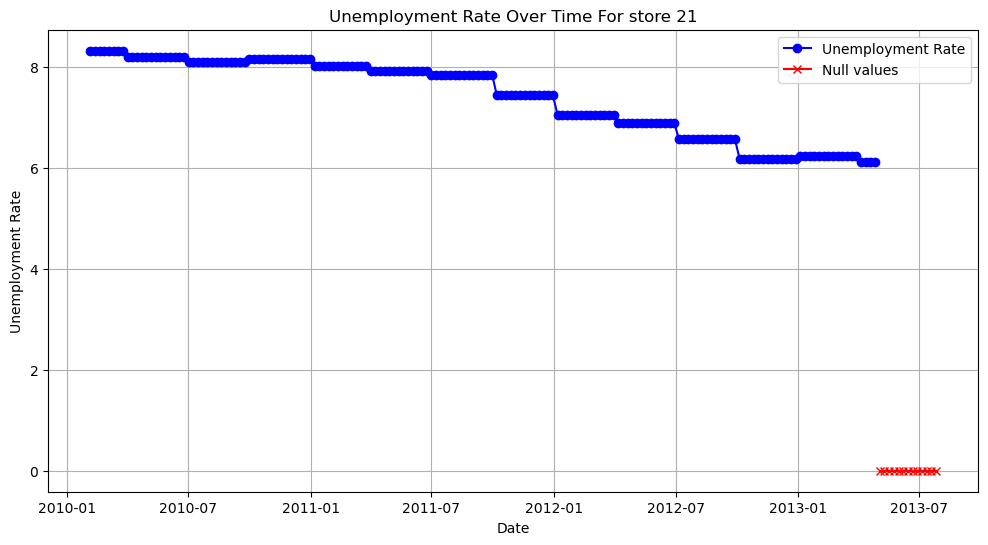

C:\Windows\Temp\ipykernel_14740\2776730321.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  null_df['Unemployment']=null_df['Unemployment'].fillna(0)


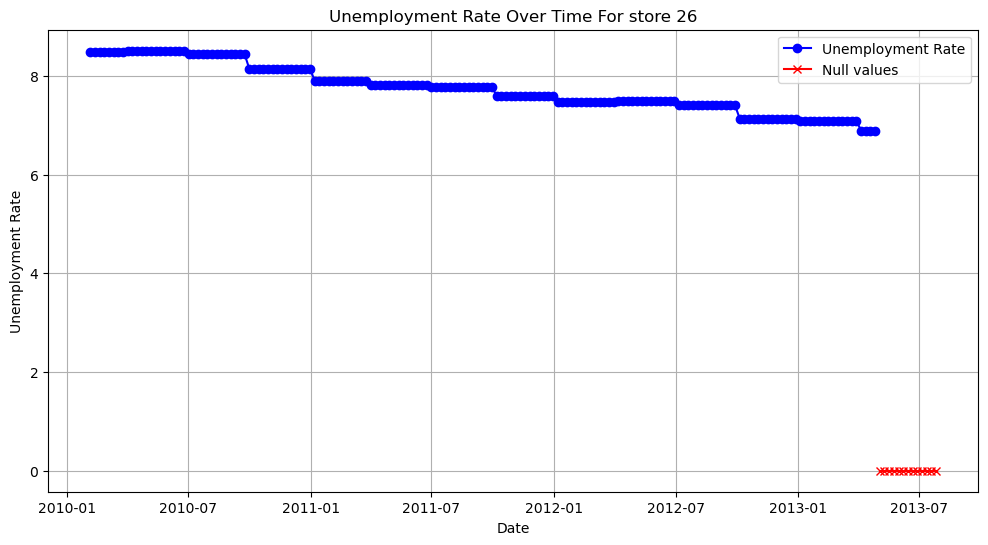

C:\Windows\Temp\ipykernel_14740\2776730321.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  null_df['Unemployment']=null_df['Unemployment'].fillna(0)


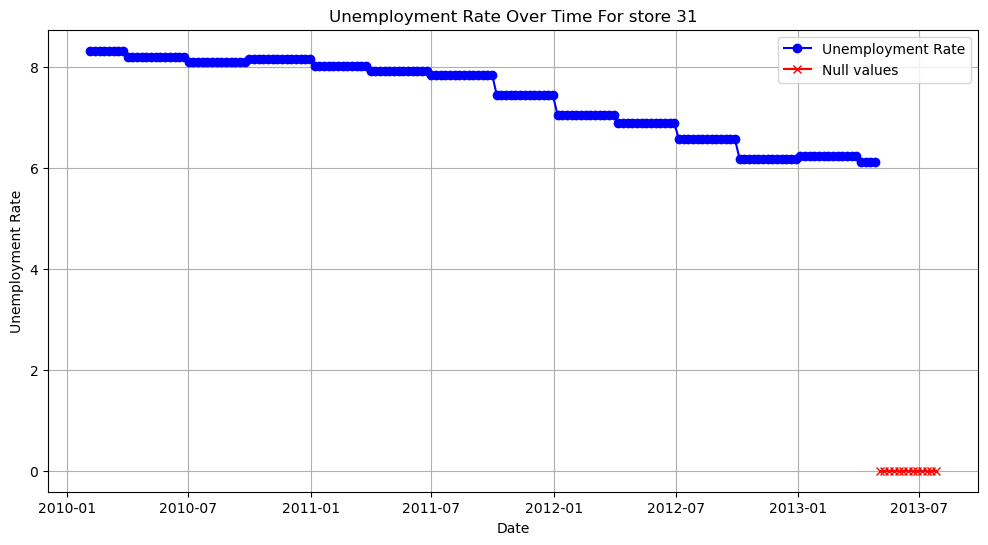

In [95]:
import matplotlib.pyplot as plt
import pandas as pd

store_ids=sorted(dataset_features['Store'].unique()[:5])

for store_id in store_ids:
    unemployment_df_store_1=dataset_features[dataset_features['Store']==store_id].sort_values('Date')[['Date','Unemployment']].reset_index(drop=True)

    temp_df = unemployment_df_store_1.copy()
    temp_df['Date'] = pd.to_datetime(temp_df['Date'])
    temp_df = temp_df.sort_values('Date').reset_index(drop=True)

    non_null_df = temp_df[temp_df['Unemployment'].notna()]
    null_df=temp_df[temp_df['Unemployment'].isna()]
    null_df['Unemployment']=null_df['Unemployment'].fillna(0)

    plt.figure(figsize=(12,6))
    plt.plot(
        non_null_df['Date'],
        non_null_df['Unemployment'],
        marker='o',
        linestyle='-',
        color='blue',
        label='Unemployment Rate'
    )
    plt.plot(
        null_df['Date'],
        null_df['Unemployment'],
        marker='x',
        linestyle='-',
        color='red',
        label='Null values'
    )

    plt.title(f'Unemployment Rate Over Time For store {store_id}')
    plt.xlabel('Date')
    plt.ylabel('Unemployment Rate')
    plt.grid(True,which='major')
    plt.legend()
    plt.show()


#### Looks like all the null values are ahead of all the data points

#### Lets confirm the time ranges in which the null values are occuring

In [96]:
unemployment_df = dataset_features.copy()

In [97]:
unemployment_df['Date'] = pd.to_datetime(unemployment_df['Date'])
unemployment_df = unemployment_df.sort_values(['Store', 'Date'])

def get_null_ranges(group):
    group = group.copy()
    group['is_null'] = group['Unemployment'].isna()

    # Identify start of each null segment
    group['null_start'] = group['is_null'] & (~group['is_null'].shift(1, fill_value=False))
    # Identify end of each null segment
    group['null_end'] = group['is_null'] & (~group['is_null'].shift(-1, fill_value=False))

    # Extract ranges
    starts = group.loc[group['null_start'], 'Date'].tolist()
    ends = group.loc[group['null_end'], 'Date'].tolist()

    return pd.DataFrame({
        'Null_Start': starts,
        'Null_End': ends
    })

# Apply to each store
null_ranges = unemployment_df.groupby('Store').apply(get_null_ranges).reset_index()

null_ranges

C:\Windows\Temp\ipykernel_14740\1706473617.py:23: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  null_ranges = unemployment_df.groupby('Store').apply(get_null_ranges).reset_index()


,Store,level_1,Null_Start,Null_End
0,1,0,2013-05-03,2013-07-26
1,2,0,2013-05-03,2013-07-26
2,3,0,2013-05-03,2013-07-26
3,4,0,2013-05-03,2013-07-26
4,5,0,2013-05-03,2013-07-26
5,6,0,2013-05-03,2013-07-26
6,7,0,2013-05-03,2013-07-26
7,8,0,2013-05-03,2013-07-26
8,9,0,2013-05-03,2013-07-26
9,10,0,2013-05-03,2013-07-26


#### The unemployment feature columns values work in form of a step function going over a certain period so clearly we impute same values to all the null values provided that they are associated in a certain time frame but we will have to figure that out. In case that there are null values present in a different time frame we will have to figure out where all the null values lie and proceed accordingly

#### Lets try forward fill

In [98]:
import pandas as pd

unemployment_df = dataset_features.copy()

unemployment_df['Date'] = pd.to_datetime(unemployment_df['Date'])
unemployment_df = unemployment_df.sort_values(['Store', 'Date']).reset_index(drop=True)

unemployment_df['Unemployment_FF'] = unemployment_df.groupby('Store')['Unemployment'].fillna(method='ffill')

unemployment_df['Unemployment_FF'] = unemployment_df.groupby('Store')['Unemployment_FF'].fillna(method='bfill')


C:\Windows\Temp\ipykernel_14740\543748408.py:8: FutureWarning: SeriesGroupBy.fillna is deprecated and will be removed in a future version. Use obj.ffill() or obj.bfill() for forward or backward filling instead. If you want to fill with a single value, use Series.fillna instead
  unemployment_df['Unemployment_FF'] = unemployment_df.groupby('Store')['Unemployment'].fillna(method='ffill')
C:\Windows\Temp\ipykernel_14740\543748408.py:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  unemployment_df['Unemployment_FF'] = unemployment_df.groupby('Store')['Unemployment'].fillna(method='ffill')
C:\Windows\Temp\ipykernel_14740\543748408.py:10: FutureWarning: SeriesGroupBy.fillna is deprecated and will be removed in a future version. Use obj.ffill() or obj.bfill() for forward or backward filling instead. If you want to fill with a single value, use Series.fillna instead
  unemployment_df['Unemployment_FF'] = u

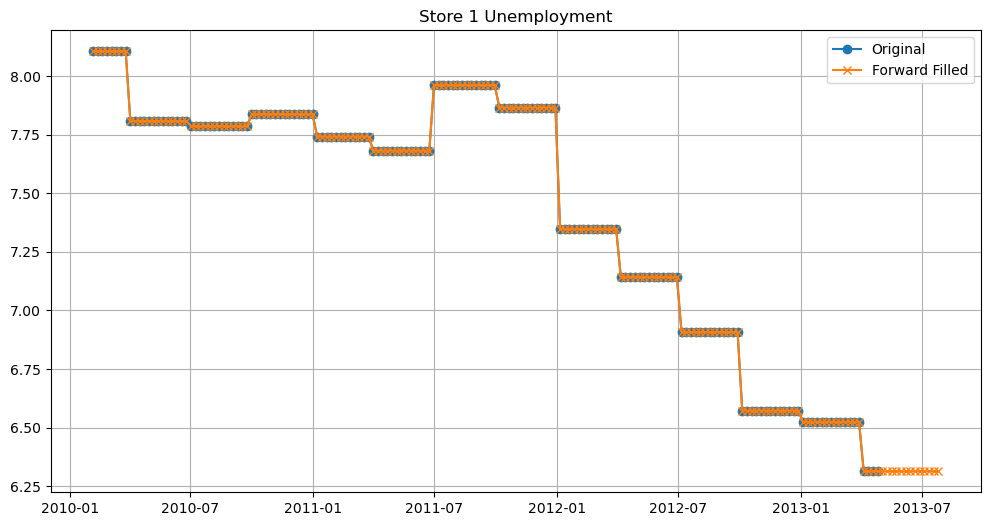

In [99]:
import matplotlib.pyplot as plt

# Plot example store
store = unemployment_df['Store'].unique()[0]
temp = unemployment_df[unemployment_df['Store'] == store]

plt.figure(figsize=(12,6))
plt.plot(temp['Date'], temp['Unemployment'], marker='o', label='Original')
plt.plot(temp['Date'], temp['Unemployment_FF'], marker='x', label='Forward Filled')
plt.title(f'Store {store} Unemployment')
plt.grid(True)
plt.legend()
plt.show()


In [100]:
unemployment_df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Total_MarkDown,Max_Weekly_Sales,Markdown_available,CPI_imputed_poly,Unemployment_FF
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,0.0,139884.94,0,211.096358,8.106
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,0.0,143081.42,0,211.242170,8.106
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,0.0,135066.75,0,211.289143,8.106
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,0.0,125048.08,0,211.319643,8.106
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,0.0,132945.44,0,211.350143,8.106


In [101]:
from statsmodels.tsa.ar_model import AutoReg
import pandas as pd

store_id = 1

unemployment_df['Date'] = pd.to_datetime(unemployment_df['Date'])
store_df = unemployment_df[unemployment_df['Store'] == store_id].sort_values('Date')
store_df = store_df.set_index('Date')

quarterly_unemp = store_df['Unemployment'].resample('QE').mean()
model = AutoReg(quarterly_unemp, lags=1).fit()

forecast = model.predict(start=len(quarterly_unemp), end=len(quarterly_unemp))
print(f"Forecasted unemployment for next quarter (Store {store_id}): {forecast.iloc[0]}")

Forecasted unemployment for next quarter (Store 1): nan


In [102]:
print(quarterly_unemp)
print(quarterly_unemp.isnull().sum())

Date
2010-03-31    8.106
2010-06-30    7.808
2010-09-30    7.787
2010-12-31    7.838
2011-03-31    7.742
2011-06-30    7.682
2011-09-30    7.962
2011-12-31    7.866
2012-03-31    7.348
2012-06-30    7.143
2012-09-30    6.908
2012-12-31    6.573
2013-03-31    6.525
2013-06-30    6.314
2013-09-30      NaN
Freq: QE-DEC, Name: Unemployment, dtype: float64
1


In [103]:
unemployment_df[(unemployment_df['Unemployment'].isna())&(unemployment_df['Store']==1)].shape

(13, 17)

In [104]:
filter_df=unemployment_df[((unemployment_df['Store']==1) & (unemployment_df['Date']<='2013-07-01')) & ((unemployment_df['Unemployment']<6.5) | (unemployment_df['Unemployment'].isna()))]
print(filter_df)
print(filter_df.shape)

     Store       Date  Temperature  Fuel_Price  MarkDown1  MarkDown2  \
165      1 2013-04-05        58.59       3.583   12872.34    5687.86   
166      1 2013-04-12        62.72       3.529    3672.43     932.58   
167      1 2013-04-19        67.10       3.451    3530.36       3.95   
168      1 2013-04-26        59.23       3.417    2387.72        NaN   
169      1 2013-05-03        66.66       3.386    2298.63       2.00   
170      1 2013-05-10        63.90       3.392    4624.61      83.88   
171      1 2013-05-17        69.53       3.454   16170.50      92.00   
172      1 2013-05-24        77.19       3.494    7959.89     178.00   
173      1 2013-05-31        78.02       3.466    2369.77     142.45   
174      1 2013-06-07        76.44       3.439    3514.75     742.59   
175      1 2013-06-14        79.86       3.431   12592.32     527.48   
176      1 2013-06-21        81.35       3.479    8104.02     417.99   
177      1 2013-06-28        83.94       3.495    4205.98     79

In [105]:
import pandas as pd

unemployment_df['Date'] = pd.to_datetime(unemployment_df['Date'])
unemployment_df=unemployment_df.sort_values(by=['Store','Date']).reset_index(drop=True)

cutoff_date = pd.to_datetime('2013-07-01')

mask = unemployment_df['Date'] <= cutoff_date

unemployment_df.loc[mask, 'Unemployment'] = unemployment_df.loc[mask, 'Unemployment'].ffill()

In [106]:
unemployment_df.isna().sum()

Store                    0
Date                     0
Temperature              0
Fuel_Price               0
MarkDown1             4158
MarkDown2             5269
MarkDown3             4577
MarkDown4             4726
MarkDown5             4140
CPI                      0
Unemployment           180
IsHoliday                0
Total_MarkDown           0
Max_Weekly_Sales      1755
Markdown_available       0
CPI_imputed_poly         0
Unemployment_FF          0
dtype: int64

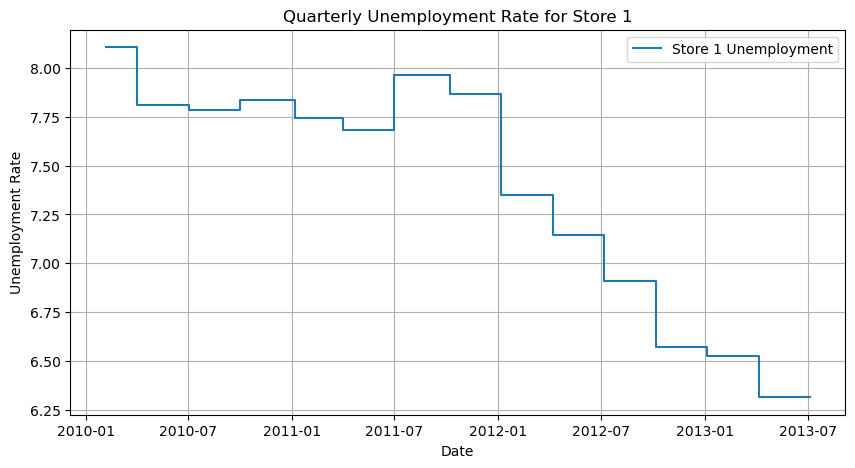

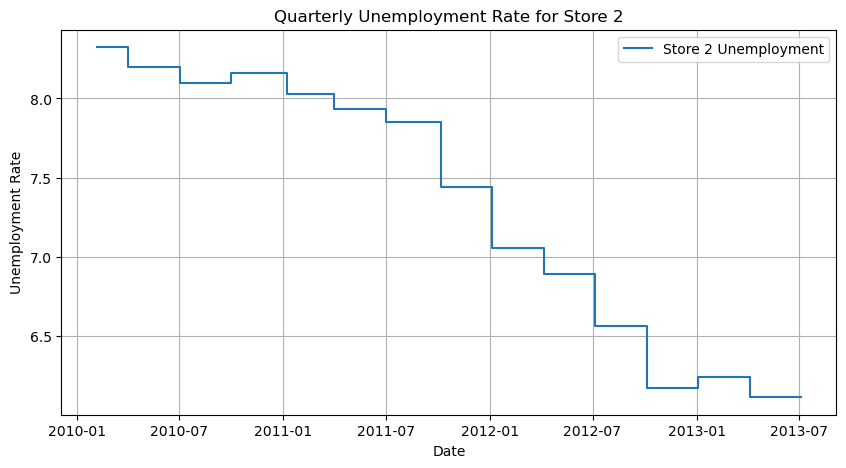

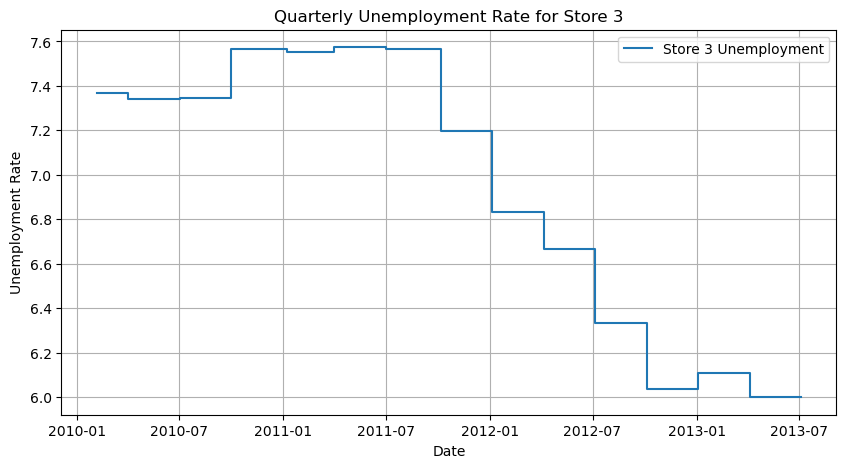

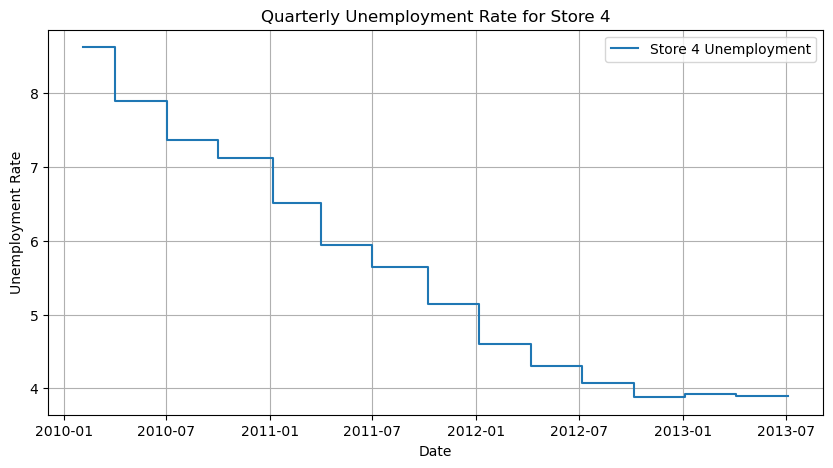

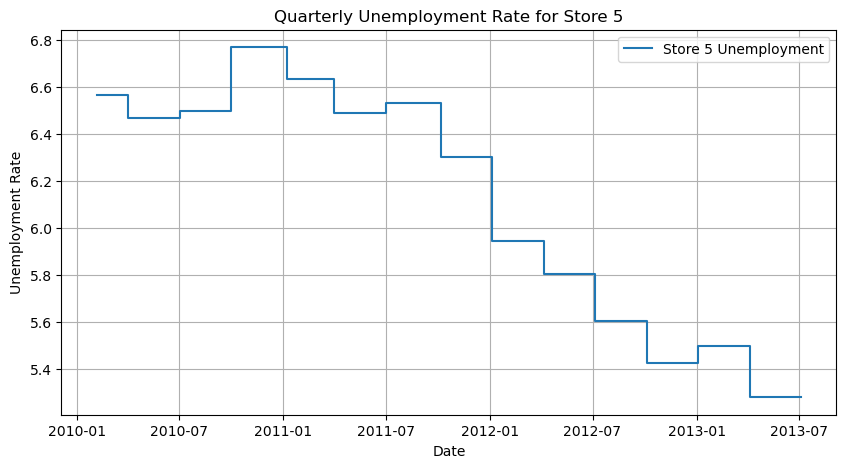

In [107]:
import matplotlib.pyplot as plt

unemployment_df['Date'] = pd.to_datetime(unemployment_df['Date'])

store_ids = unemployment_df['Store'].unique()[:5]
for id in store_ids:
    store_df = unemployment_df[unemployment_df['Store'] == id].sort_values('Date')

    plt.figure(figsize=(10,5))
    plt.step(store_df['Date'], store_df['Unemployment'], where='post', label=f'Store {id} Unemployment')
    plt.xlabel("Date")
    plt.ylabel("Unemployment Rate")
    plt.title(f"Quarterly Unemployment Rate for Store {id}")
    plt.grid(True)
    plt.legend()
    plt.show()

In [108]:
filter_df=unemployment_df[((unemployment_df['Store']==1) & (unemployment_df['Date']>'2013-07-01')) & ((unemployment_df['Unemployment']<6.5) | (unemployment_df['Unemployment'].isna()))]
filter_df.shape

(4, 17)

In [109]:
4*45

180

#### This explains 2 things: 1) We now know why there are missing values in the CPI feature column (Maybe syncing issue in the data collection pipeline or CPI values not announced for the store probably happens after a certain period of time), and 2) Why there is a gap in the histogram of CPI (Some store CPI values start at around 120 and end to 130 or 140 and some stores CPI values start from around 180 and maybe goes to 190 or 220)

In [110]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

unemployment_df['Date'] = pd.to_datetime(unemployment_df['Date'])
unemployment_df = unemployment_df.sort_values(['Store', 'Date']).reset_index(drop=True)


In [111]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

def impute_unemployment_arima(store_df, target_col='Unemployment', pred_col='Unemployment_ARIMA'):
    """
    Impute missing values using ARIMA for a single store.
    Keeps original column intact, outputs new predicted column.
    """
    store_df = store_df.copy().set_index('Date')
    
    store_df[pred_col] = store_df[target_col]
    
    store_df[pred_col] = store_df[pred_col].ffill()
    
    ts_train = store_df[target_col].dropna()
    
    if store_df[target_col].isna().sum() == 0:
        return store_df.reset_index()
    
    model = ARIMA(ts_train, order=(2,0,0))
    model_fit = model.fit()
    
    for idx in store_df[store_df[target_col].isna()].index:
        pred = model_fit.predict(start=len(ts_train), end=len(ts_train))
        ts_train = pd.concat([ts_train, pd.Series([pred.iloc[0]], index=[idx])])
        store_df.at[idx, pred_col] = pred.iloc[0]
    
    return store_df.reset_index()


In [112]:
stores = unemployment_df['Store'].unique()
imputed_dfs = []

for store_id in stores:
    store_df = unemployment_df[unemployment_df['Store'] == store_id]
    imputed_store_df = impute_unemployment_arima(store_df)
    imputed_dfs.append(imputed_store_df)

df_imputed = pd.concat(imputed_dfs).sort_values(['Store', 'Date']).reset_index(drop=True)

c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
c:\Users\aadit\Anaconda\envs\store-sales-forecast\lib\site-packa

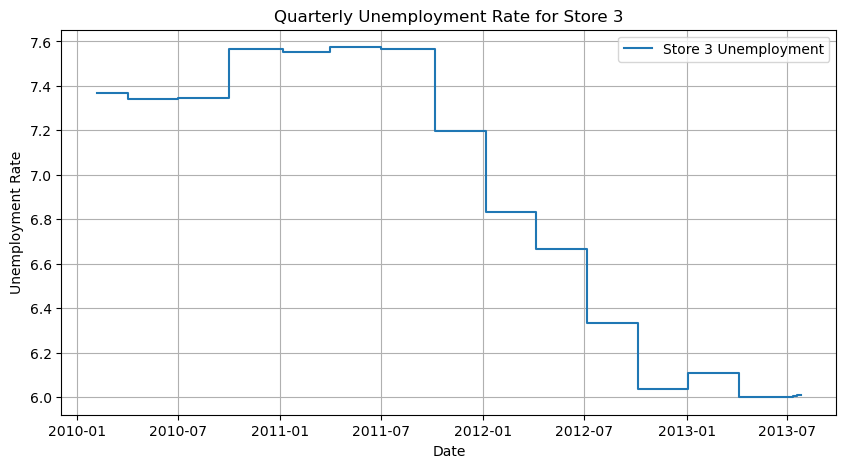

In [113]:
import matplotlib.pyplot as plt

df_imputed['Date'] = pd.to_datetime(df_imputed['Date'])

store_id = 3
store_df = df_imputed[df_imputed['Store'] == store_id].sort_values('Date')

plt.figure(figsize=(10,5))
plt.step(store_df['Date'], store_df['Unemployment_ARIMA'], where='post', label=f'Store {store_id} Unemployment')
plt.xlabel("Date")
plt.ylabel("Unemployment Rate")
plt.title(f"Quarterly Unemployment Rate for Store {store_id}")
plt.grid(True)
plt.legend()
plt.show()

In [114]:
import pandas as pd
import numpy as np

unemployment_df['Date'] = pd.to_datetime(unemployment_df['Date'])

unemployment_df['Quarter'] = unemployment_df['Date'].dt.to_period('Q')

In [115]:
unemployment_df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Total_MarkDown,Max_Weekly_Sales,Markdown_available,CPI_imputed_poly,Unemployment_FF,Quarter
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,0.0,139884.94,0,211.096358,8.106,2010Q1
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,0.0,143081.42,0,211.242170,8.106,2010Q1
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,0.0,135066.75,0,211.289143,8.106,2010Q1
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,0.0,125048.08,0,211.319643,8.106,2010Q1
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,0.0,132945.44,0,211.350143,8.106,2010Q1


In [116]:
quarterly_mean = unemployment_df.groupby(['Store', 'Quarter'])['Unemployment'].mean().reset_index()

In [117]:
quarterly_mean.head()

,Store,Quarter,Unemployment
0,1,2010Q1,8.106
1,1,2010Q2,7.808
2,1,2010Q3,7.787
3,1,2010Q4,7.838
4,1,2011Q1,7.742


In [118]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

def predict_all_quarters(store_quarter_df, degree=5):
    store_quarter_df = store_quarter_df.copy()
    store_quarter_df['Quarter_num'] = np.arange(len(store_quarter_df))

    # Training data
    train_df = store_quarter_df.dropna(subset=['Unemployment'])
    # print(train_df['Quarter_num'].values.reshape(-1,1))
    X = train_df['Quarter_num'].values.reshape(-1,1)
    # print(train_df['Unemployment'].values)
    y = train_df['Unemployment'].values

    # Polynomial fit
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)
    model = LinearRegression().fit(X_poly, y)

    # Predict for ALL quarters in dataset
    X_all = store_quarter_df['Quarter_num'].values.reshape(-1,1)
    store_quarter_df['Predicted'] = model.predict(poly.transform(X_all))

    return store_quarter_df[['Quarter','Predicted']]

In [119]:
# --- Imputation ---
for store_id in unemployment_df['Store'].unique():
    # Quarterly-level regression predictions
    store_quarter_df = quarterly_mean[quarterly_mean['Store']==store_id]
    pred_quarters = predict_all_quarters(store_quarter_df, degree=5)

    # Map back to unemployment_df
    for _, row in pred_quarters.iterrows():
        mask = (
            (unemployment_df['Store']==store_id) &
            (unemployment_df['Quarter']==row['Quarter']) &
            (unemployment_df['Unemployment'].isna())
        )
        unemployment_df.loc[mask, 'Unemployment_pred'] = row['Predicted']


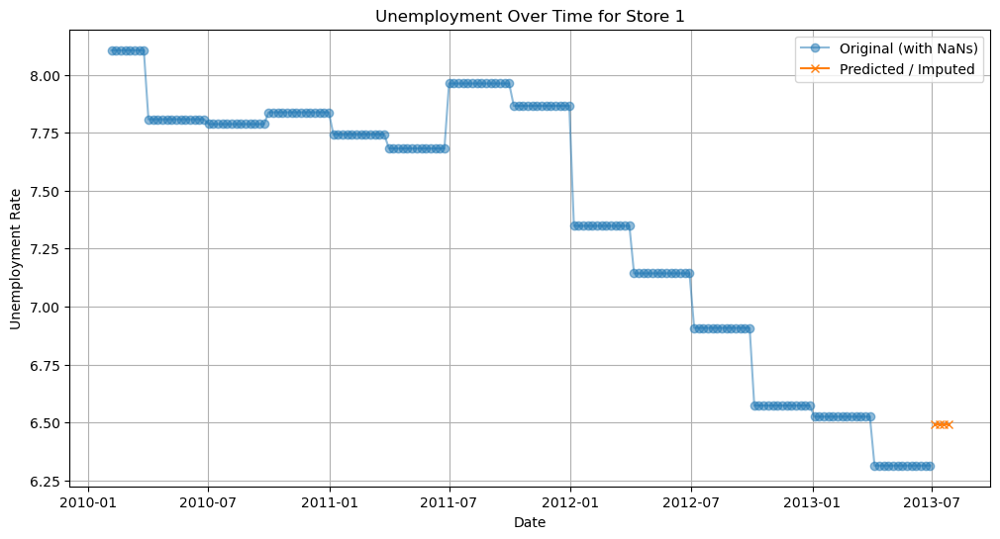

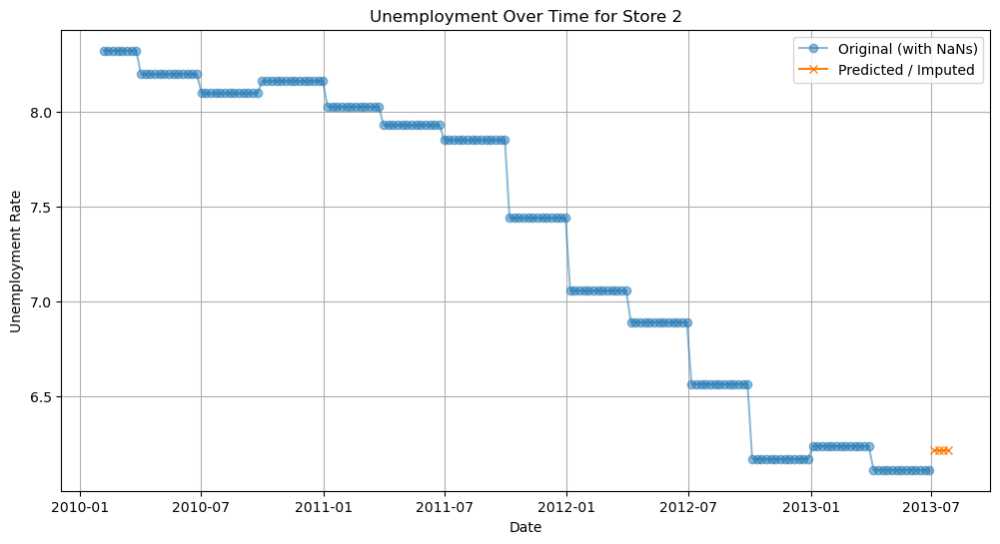

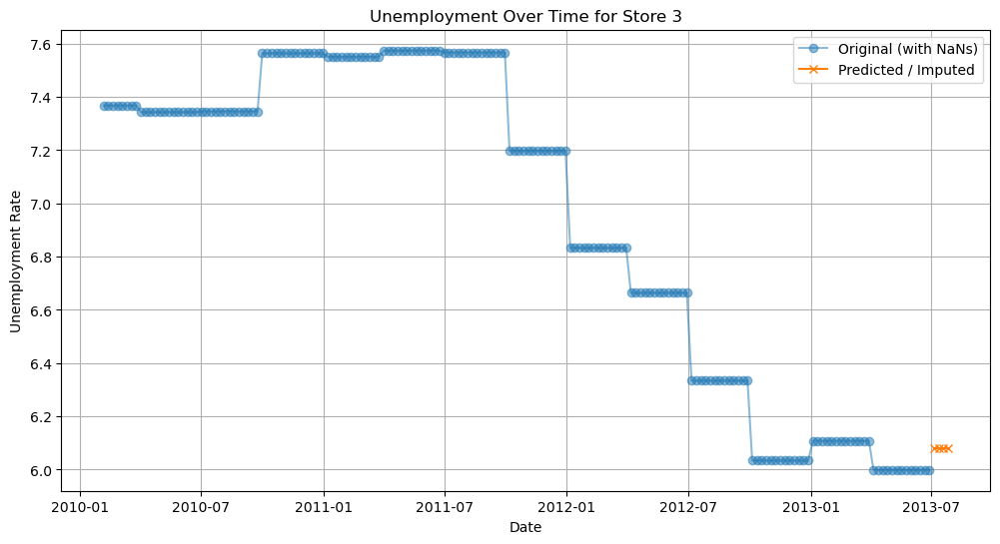

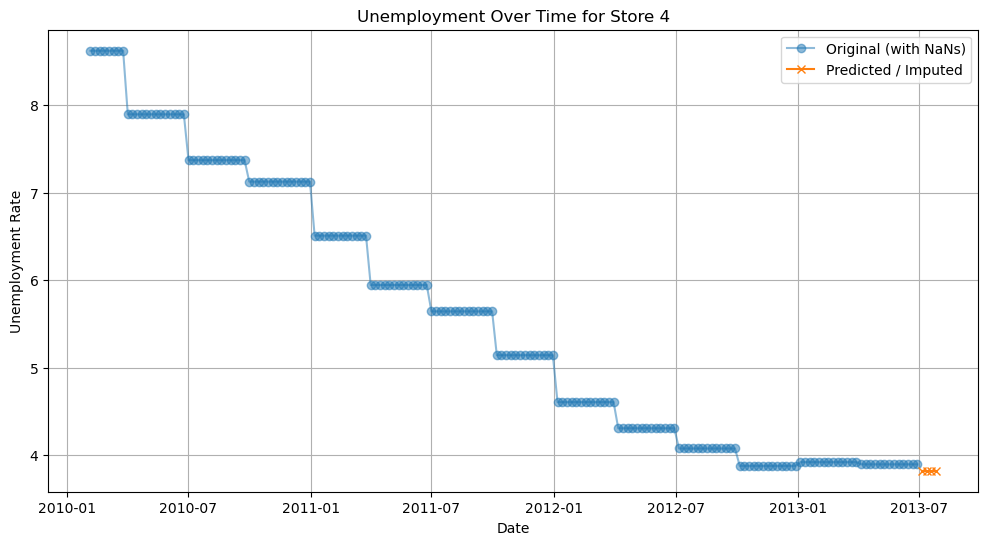

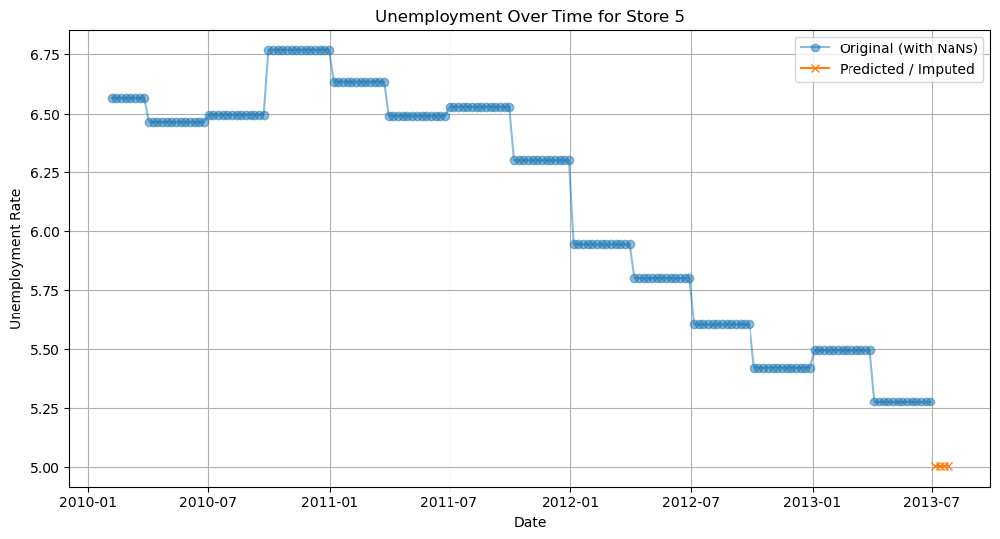

In [120]:
import matplotlib.pyplot as plt

store_ids = sorted(unemployment_df['Store'].unique()[:5])

for id in store_ids:
    store_df = unemployment_df[unemployment_df["Store"] == id]

    plt.figure(figsize=(12, 6))

    plt.plot(store_df["Date"], store_df["Unemployment"], label="Original (with NaNs)", marker="o",alpha=0.5)
    plt.plot(store_df["Date"], store_df["Unemployment_pred"], label="Predicted / Imputed", marker="x")

    plt.title(f"Unemployment Over Time for Store {id}")
    plt.xlabel("Date")
    plt.ylabel("Unemployment Rate")
    plt.legend()
    plt.grid(True)
    plt.show()


In [121]:
unemployment_df.isna().sum()

Store                    0
Date                     0
Temperature              0
Fuel_Price               0
MarkDown1             4158
MarkDown2             5269
MarkDown3             4577
MarkDown4             4726
MarkDown5             4140
CPI                      0
Unemployment           180
IsHoliday                0
Total_MarkDown           0
Max_Weekly_Sales      1755
Markdown_available       0
CPI_imputed_poly         0
Unemployment_FF          0
Quarter                  0
Unemployment_pred     8010
dtype: int64

In [122]:
unemployment_df.notna().sum()

Store                 8190
Date                  8190
Temperature           8190
Fuel_Price            8190
MarkDown1             4032
MarkDown2             2921
MarkDown3             3613
MarkDown4             3464
MarkDown5             4050
CPI                   8190
Unemployment          8010
IsHoliday             8190
Total_MarkDown        8190
Max_Weekly_Sales      6435
Markdown_available    8190
CPI_imputed_poly      8190
Unemployment_FF       8190
Quarter               8190
Unemployment_pred      180
dtype: int64

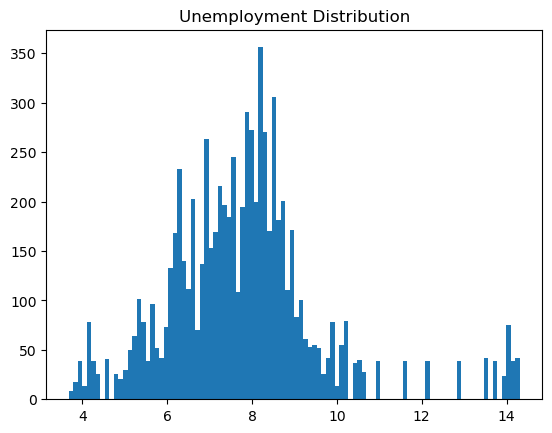

In [123]:
plt.hist(dataset_features['Unemployment'],bins=100)
plt.title("Unemployment Distribution")
plt.show()

#### We verified our whole and it is resulting in no null values once we implute the values from Unemployment_pred feature column to Unemployment feature column

#### Now its time to officially impute the predicted values to the null values of the Unemployment feature column

In [124]:
unemployment_df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Total_MarkDown,Max_Weekly_Sales,Markdown_available,CPI_imputed_poly,Unemployment_FF,Quarter,Unemployment_pred
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,0.0,139884.94,0,211.096358,8.106,2010Q1,NaN
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,0.0,143081.42,0,211.242170,8.106,2010Q1,NaN
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,0.0,135066.75,0,211.289143,8.106,2010Q1,NaN
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,0.0,125048.08,0,211.319643,8.106,2010Q1,NaN
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,0.0,132945.44,0,211.350143,8.106,2010Q1,NaN


In [125]:
unemployment_df.isna().sum()

Store                    0
Date                     0
Temperature              0
Fuel_Price               0
MarkDown1             4158
MarkDown2             5269
MarkDown3             4577
MarkDown4             4726
MarkDown5             4140
CPI                      0
Unemployment           180
IsHoliday                0
Total_MarkDown           0
Max_Weekly_Sales      1755
Markdown_available       0
CPI_imputed_poly         0
Unemployment_FF          0
Quarter                  0
Unemployment_pred     8010
dtype: int64

In [126]:
unemployment_df=unemployment_df.sort_values(by=['Store','Date']).reset_index(drop=True)
unemployment_df['Unemployment']=unemployment_df['Unemployment'].fillna(unemployment_df['Unemployment_pred'])
unemployment_df.isna().sum()

Store                    0
Date                     0
Temperature              0
Fuel_Price               0
MarkDown1             4158
MarkDown2             5269
MarkDown3             4577
MarkDown4             4726
MarkDown5             4140
CPI                      0
Unemployment             0
IsHoliday                0
Total_MarkDown           0
Max_Weekly_Sales      1755
Markdown_available       0
CPI_imputed_poly         0
Unemployment_FF          0
Quarter                  0
Unemployment_pred     8010
dtype: int64

In [127]:
# Make sure unemployment_df has the right columns
unemployment_merging_df = unemployment_df[['Store', 'Date', 'Unemployment_pred']]
features_stores_merged_df=features_stores_merged_df.sort_values(by=['Store','Date']).reset_index(drop=True)

# Merge predictions into features_stores_merged_df
features_stores_merged_df = features_stores_merged_df.merge(
    unemployment_merging_df,
    on=['Store', 'Date'],
    how='left'
)

# Fill missing Unemployment with predictions
features_stores_merged_df['Unemployment'] = (
    features_stores_merged_df['Unemployment']
    .fillna(unemployment_df['Unemployment'])
)

# Drop the helper column if you want
features_stores_merged_df = features_stores_merged_df.drop(columns=['Unemployment_pred'])


In [128]:
features_stores_merged_df.drop(columns=['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5','Max_Weekly_Sales'],inplace=True)
features_stores_merged_df.isna().sum()

Store                 0
Date                  0
Temperature           0
Fuel_Price            0
CPI                   0
Unemployment          0
IsHoliday             0
Total_MarkDown        0
Markdown_available    0
Type                  0
Size                  0
dtype: int64

In [129]:
dataset_train.isna().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

#### We can probably feature engineer IsHoliday feature column into respective holidays but first lets check which day is coming under the case where the stores experience holidays

In [130]:
dataset_features['Date'] = pd.to_datetime(dataset_features['Date'])
holiday_dates = dataset_features['Date']
day_names = holiday_dates.dt.day_name().unique()
print(day_names)

['Friday']


In [131]:
dataset_features['Date'] = pd.to_datetime(dataset_features['Date'])
holiday_dates = dataset_features[dataset_features['IsHoliday'] == True]['Date']
holiday_weekdays = holiday_dates.dt.day_name().unique()
print(holiday_weekdays)

['Friday']


In [132]:
dataset_features[dataset_features['IsHoliday']==True].shape

(585, 16)

In [133]:
dataset_features['Date'] = pd.to_datetime(dataset_features['Date'])
holiday_dates = dataset_features[dataset_features['IsHoliday'] == True]['Date'].dt.date.unique()
print(holiday_dates)

[datetime.date(2010, 2, 12) datetime.date(2010, 9, 10)
 datetime.date(2010, 11, 26) datetime.date(2010, 12, 31)
 datetime.date(2011, 2, 11) datetime.date(2011, 9, 9)
 datetime.date(2011, 11, 25) datetime.date(2011, 12, 30)
 datetime.date(2012, 2, 10) datetime.date(2012, 9, 7)
 datetime.date(2012, 11, 23) datetime.date(2012, 12, 28)
 datetime.date(2013, 2, 8)]


In [134]:
dataset_stores.isna().sum()

Store    0
Type     0
Size     0
dtype: int64

#### Analysis of dataset_stores starts

In [135]:
dataset_stores.shape

(45, 3)

In [136]:
dataset_stores['Store'].unique().shape

(45,)

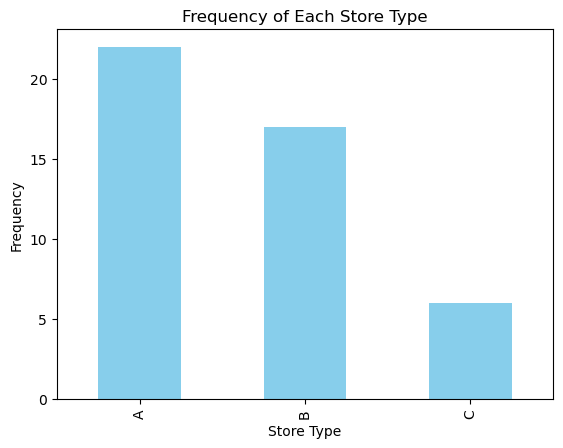

In [137]:
import matplotlib.pyplot as plt

# Count frequencies
type_counts = dataset_stores['Type'].value_counts()

# Plot
type_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Store Type')
plt.ylabel('Frequency')
plt.title('Frequency of Each Store Type')
plt.show()


In [138]:
print(dataset_stores.describe())
dataset_stores.shape

           Store           Size
count  45.000000      45.000000
mean   23.000000  130287.600000
std    13.133926   63825.271991
min     1.000000   34875.000000
25%    12.000000   70713.000000
50%    23.000000  126512.000000
75%    34.000000  202307.000000
max    45.000000  219622.000000


(45, 3)

In [139]:
dataset_stores.dtypes

Store     int64
Type     object
Size      int64
dtype: object

In [140]:
dataset_stores['Type'].unique()

array(['A', 'B', 'C'], dtype=object)

In [141]:
len(dataset_stores['Size'].unique())

40

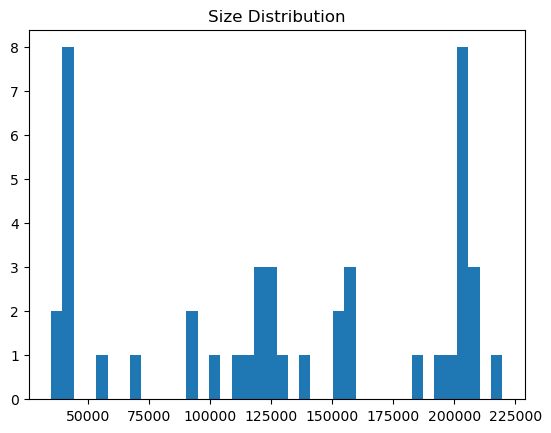

In [142]:
plt.hist(dataset_stores['Size'],bins=dataset_stores['Size'].unique().shape[0])
plt.title("Size Distribution")
plt.show()

#### Assumption: There are 2 gaps appearing in the distribution of the Size feature column(one at 75000 and another at 175000). Our assumption is that it is related to the Type feature column as it contains 3 unique values. Lets verify it

In [143]:
for val in dataset_stores['Type'].unique():
    print(f"Min and max values of Size for store type {val}:",dataset_stores[dataset_stores['Type']==val]['Size'].min(),dataset_stores[dataset_stores['Type']==val]['Size'].max())

Min and max values of Size for store type A: 39690 219622
Min and max values of Size for store type B: 34875 140167
Min and max values of Size for store type C: 39690 42988


#### The assumption was false related to type feature column acting as a bucketing column for size feature column

#### Now lets store these datasets into some files for eda and feature extraction phase

In [144]:
import os

dataset_dir=os.path.join('..','data','preprocessing')
os.makedirs(dataset_dir,exist_ok=True)

dataset_train.to_csv(os.path.join(dataset_dir,'train.csv'),index=False)
features_stores_merged_df.to_csv(os.path.join(dataset_dir,'features_stores_merged.csv'),index=False)

#### Now you can go ahead to notebooks/eda.ipynb for furthur reviewing the project